# Correlation
This aim of this working notebook is to find the correlation of the different variables. It is a close copy of the low frequency one, but the scale are adapted to high frequency data

In [2]:
#import the necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as  np
from scipy import signal
import scipy
import ipywidgets as widgets
from ipywidgets import interact, interact_manual
from ipywidgets import interactive
from IPython.display import HTML
import math
import datetime

In [104]:
#load the dataset
data_path = "..\\Datasets\\Forecasting_aqua\\data_h_rolling_cst_int_v4.csv"
format = "%Y-%m-%d %H:%M:%S"
df = pd.read_csv(data_path)
time_df = pd.to_datetime(df["Datetime"], format=format)
try:
    df.drop("sample",axis=1,inplace=True)
except:
    pass
df['Datetime']= time_df
#According to the work of Stefanie Merkly, these keys were more important than the others to predict chorophill a
keys_imp = ['ciliate','mean_chla','cv_chla_day','cv_chla_depth',
            'nauplius','Ammonium','Nitrat','mean_schmidt','windspeed_max',
            'mean_thermocline_depth','mean_epi_temp','mean_oxycline_depth',
            'mean_mixed_layer_depth','mean_global_radiation'
           ]
#add some usefull variables at the end of the table
df['year'] = df['Datetime'].dt.year
df['month'] = df['Datetime'].dt.month
df['day'] = df['Datetime'].dt.day

#drop the first datapoints the first months are only meteorological data
first_point = (~df['mean_chla_depth'].isnull()).idxmax()
dfs = df.drop(index=range(first_point))
df = dfs.reset_index(drop=True)

In [105]:
#prepare the tickslabels (the months and corresponding start dates)
months=[]
fday = []
for day in range(1,366):
    dstr = str(day)
    date = datetime.datetime.strptime("2019-" + dstr, "%Y-%j")
    months.append(date.strftime("%b"))
months,fday = np.unique(months,return_index=True)
#the months are not in order, but the ticks are still correct
print(months)
print(fday)

['Apr' 'Aug' 'Dec' 'Feb' 'Jan' 'Jul' 'Jun' 'Mar' 'May' 'Nov' 'Oct' 'Sep']
[ 90 212 334  31   0 181 151  59 120 304 273 243]


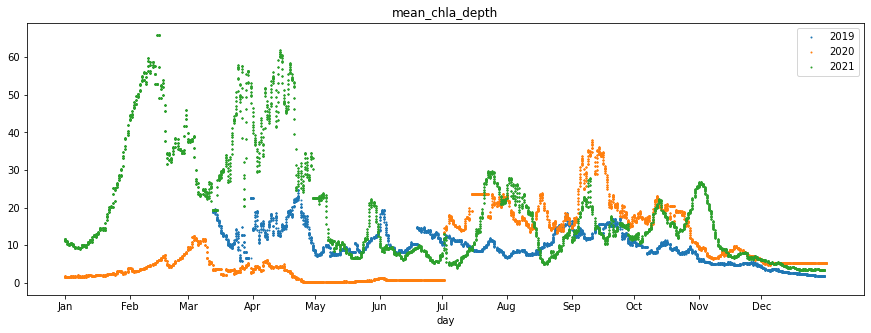

In [106]:
#plot the data:
key = 'mean_chla_depth' #this key can be changed to check any other one

##################
fig,ax = plt.subplots(1,figsize=(15,5))

years = df['year'].unique()
for year in years:
    dfy = df[df['year']==year]
    yeardt = np.datetime64(str(year),'Y')
    n_days = (dfy['Datetime']-yeardt).dt.days
    ax.scatter(n_days,dfy[key],s=1)
ax.legend([str(year) for year in years])
ax.set_title(key)
ax.set_xlabel("day")
ax.set_xticks(fday)
ax.set_xticklabels(months)
plt.show()

[]

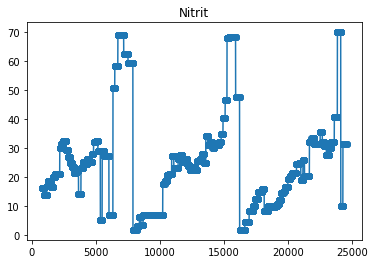

In [107]:
#interpolation
dfd = df.drop('Datetime',axis=1) #the datetime format is not well supported
dfi = dfd.interpolate(method='akima', limit_direction='forward', axis=0)

#plot an example key
key='Nitrit'
plt.scatter(np.arange(len(df)),df[key])
plt.plot(np.arange(len(dfi)),dfi[key])
plt.title(key)
plt.plot()

# Autocorrelation

## Full

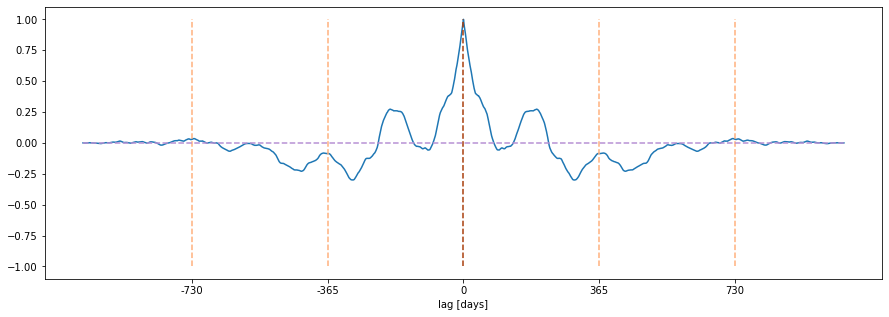

In [108]:
#compute the autocorrelation of the full signal
key = 'mean_chla_depth'
fig,ax = plt.subplots(1,figsize=(15,5))

dfci = dfi-dfi.mean()
dfci = dfci.fillna(0)
autocor = signal.correlate(dfci[key],dfci[key], mode='full').astype(float)
autocor /=np.max(autocor)#dfci[key].std()*dfci[key].std()*len(dfci[key])
lags = signal.correlation_lags(len(dfci[key]), len(dfci[key]), mode='full')
ax.plot(lags,autocor)
for k in range(-len(years)+1,len(years)):
    if k==0:
        ax.vlines(0, -1, 1,linestyles='dashed',color='xkcd:rust')
    else:
        ax.vlines(365*24*k, -1, 1,linestyles='dashed',color='xkcd:peach')
ax.hlines(0,lags[0],lags[-1],linestyles='dashed',color='xkcd:pale purple')
ax.set_xticks(np.linspace(-365*2*24,365*2*24,5))
ax.set_xticklabels(np.linspace(-365*2,365*2,5,dtype=int))
ax.set_xlabel("lag [days]")
plt.show()

### Normalization methods:
The correlation can be computed in several different ways, the ones that are tried in this notebook are:
- Mean: Compute the autocorrelation on the full signal (with its mean removed), and pad the values outside of it with 0s
- Periodicity: Compute the autocorrelation on the full signal (with its mean removed) and pad its outside values with a copy of itself. This method infers that the signal is periodic
- Recomputation of the statistics: Recompute the mean and variance of the part of the signal used at each lag. This method tends to oscillate at the boundaries, when the number of points used is small. This oscillation can be mitigated by computing the correlation on several different crop of the signal and taking the mean

Check the summary notebook if interested for more information.
#### Mean

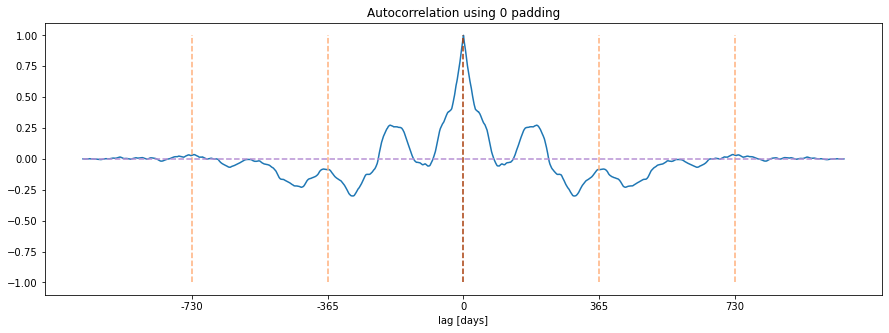

In [109]:
#chose a key
key = 'mean_chla_depth'
#remove the mean
dfci = dfi-dfi.mean()
#remove NaNs (they are replaced with 0s)
dfci = dfci.fillna(0)
#correlate
autocor = signal.correlate(dfci[key],dfci[key], mode='full').astype(float)
#normalize
autocor /=dfci[key].std()*dfci[key].std()*len(dfci[key])
#build the x axis coordinates
lags = signal.correlation_lags(len(dfci[key]), len(dfci[key]), mode='full')

#plot
fig,ax = plt.subplots(1,figsize=(15,5))
ax.plot(lags,autocor)
#plot a vertical line each year
for k in range(-len(years)+1,len(years)):
    if k==0:
        ax.vlines(0, -1, 1,linestyles='dashed',color='xkcd:rust')
    else:
        ax.vlines(365*24*k, -1, 1,linestyles='dashed',color='xkcd:peach')
ax.hlines(0,lags[0],lags[-1],linestyles='dashed',color='xkcd:pale purple')
ax.set_xticks(np.linspace(-365*2*24,365*2*24,5))
ax.set_xticklabels(np.linspace(-365*2,365*2,5,dtype=int))
ax.set_xlabel("lag [days]")
ax.set_title("Autocorrelation using 0 padding")
plt.show()

#### Periodicity

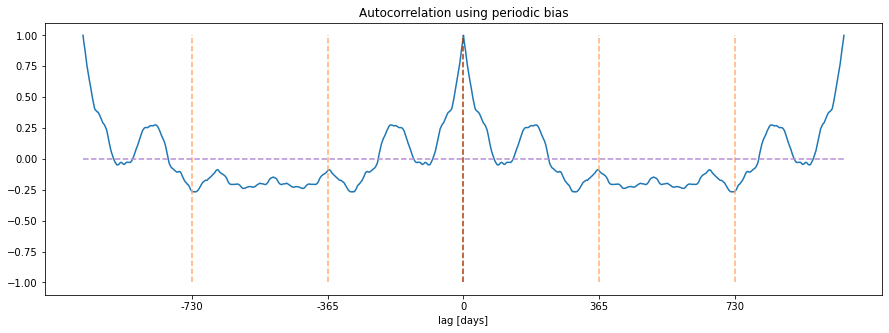

In [110]:
#chose a key
key = 'mean_chla_depth'
#remove the mean
dfci = dfi-dfi.mean()
#remove the NaNs
dfci = dfci.fillna(0)
#perform the autocorrelation (appending the signal to itself)
autocor =  signal.correlate(pd.concat([dfci[key],dfci[key]]),dfci[key], mode='valid').astype(float)
#normalize
autocor /= dfci[key].std()*dfci[key].std()*len(dfci[key])
#build the x coordinates
lags = signal.correlation_lags(len(dfci[key])*2, len(dfci[key]), mode='valid')
#plot
fig,ax = plt.subplots(1,figsize=(15,5))
ax.plot(np.concatenate((np.flip(-lags),lags)),np.concatenate((autocor,autocor)))
for k in range(-len(years)+1,len(years)):
    if k==0:
        ax.vlines(0, -1, 1,linestyles='dashed',color='xkcd:rust')
    else:
        ax.vlines(365*24*k, -1, 1,linestyles='dashed',color='xkcd:peach')
ax.hlines(0,-lags[-1],lags[-1],linestyles='dashed',color='xkcd:pale purple')
ax.set_xticks(np.linspace(-365*2*24,365*2*24,5))
ax.set_xticklabels(np.linspace(-365*2,365*2,5,dtype=int))
ax.set_xlabel("lag [days]")
ax.set_title("Autocorrelation using periodic bias")
plt.show()

#### Autocorrelation by recomputing statistics

In [111]:
#define a function performing the normalized autocorrelation
#note: this function compute the mean and std in a different way than in the low frequency notebook
#as the previous version was too slow
def autovariance(array,epsilon = 0.0000001):
    #build the x axis
    lags = signal.correlation_lags(len(array), len(array), mode='full')
    #allocate the memory
    autocor = np.zeros(len(lags))
    #the mean and std are computed online to optimize the speed
    mean1 = 0
    ss1 = 0
    c1 = 0
    mean2 = 0
    ss2 = 0
    c2 = 0
    #iter over the different lags
    for idx in range(1,len(array)+1):
        input1 = array[:idx]
        if array[idx-1]==array[idx-1]:
            c1+=1
            mean1 = mean1*(c1-1)/c1+array[idx-1]/c1
            std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
            ss1 = ss1*(c1-1)/c1+array[idx-1]*array[idx-1]/c1
        input1 = (input1-mean1)/(std1+epsilon)#normalize
        input2 = array[-idx:]
        if array[-idx]==array[-idx]:
            c2+=1
            mean2 = mean2*(c2-1)/c2+array[-idx]/c2
            std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
            ss2 = ss2*(c1-1)/c2+array[-idx]*array[-idx]/c2
        input2 = (input2-mean2)/(std2+epsilon)#normalize
        autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs
        autocor[-idx]=autocor[idx-1] #use symetry to save some time
    return autocor

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\2275208765.py:29: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\2275208765.py:32: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\2275208765.py:22: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)


ValueError: x and y must have same first dimension, but have shapes (49131,) and (49083,)

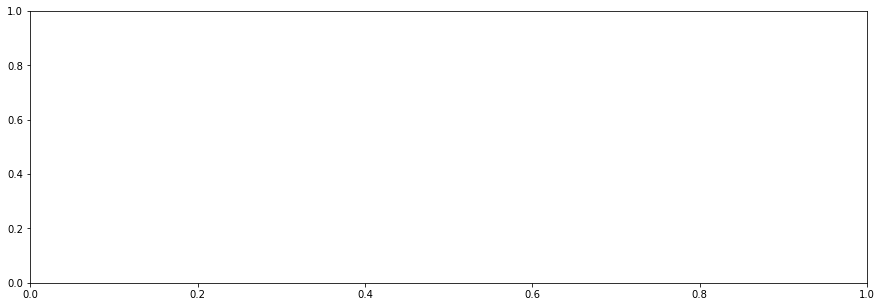

In [112]:
#perform the autovariance n_rep times, each time with a signal slightly delayed
def autovar_rep(serie_base,n_rep=50):
    lags = signal.correlation_lags(len(serie_base)-n_rep, len(serie_base)-n_rep, mode='full')
    autocor_a = np.zeros((n_rep,len(lags)))
    for i in range(n_rep):
        serie = serie_base[i:-n_rep+i]
        autocor_a[i,:] = autovariance(serie.to_numpy())
    return autocor_a,lags

#chose a key
key = 'mean_chla_depth'
#chose the number of repetition
n_rep = 24

#select the serie, with  nans droped (as the serie is interpolated, only the first/last values are dropped)
serie_base = dfi[key].dropna()

#run the function
autocor_a,lags = autovar_rep(serie_base,n_rep)

#plot
fig,ax = plt.subplots(1,figsize=(15,5))
ax.plot(lags,mean)
shade = ax.fill_between(lags, mean - 1.96*std, mean + 1.96*std,
                        color='gray', alpha=0.2) 

    
for k in range(-len(years)+1,len(years)):
    if k==0:
        ax.vlines(0, -1, 1,linestyles='dashed',color='xkcd:rust')
    else:
        ax.vlines(365*24*k, -1, 1,linestyles='dashed',color='xkcd:peach')
ax.hlines(0,-lags[-1],lags[-1],linestyles='dashed',color='xkcd:pale purple')
ax.set_xticks(np.linspace(-365*2*24,365*2*24,5))
ax.set_xticklabels(np.linspace(-365*2,365*2,5,dtype=int))
ax.set_xlabel("lag [days]")
ax.set_title("Autocorrelation + recomputing of statistics")
ax.set_ylim(-1.1, 1.1)
plt.show()

### Plot all auto correlations:
All of the keys are plotted similarly to the previous version, using the recomputation of the statistics

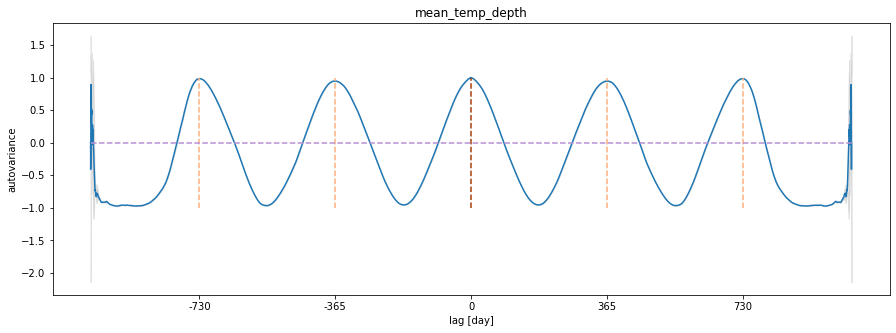

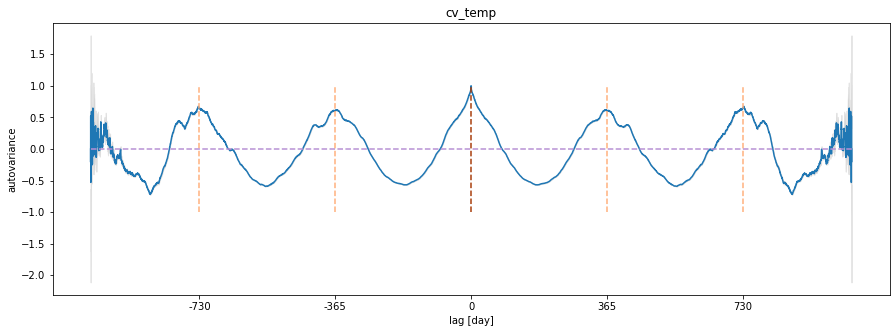

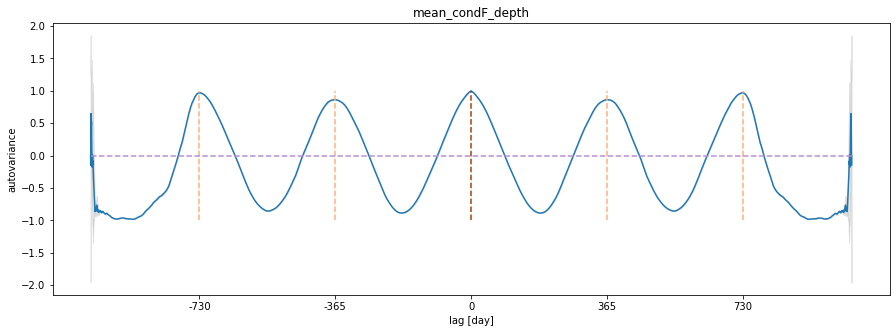

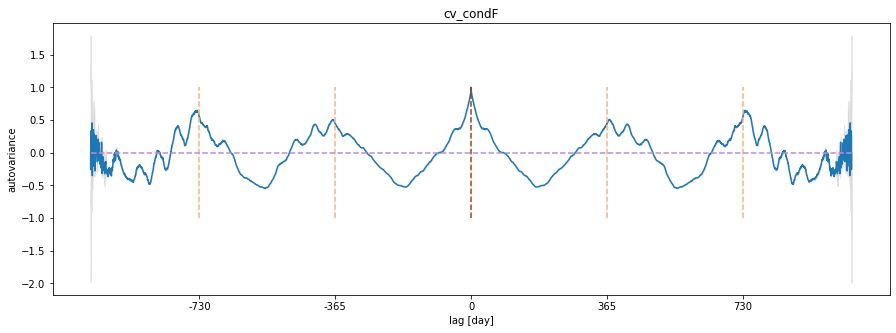

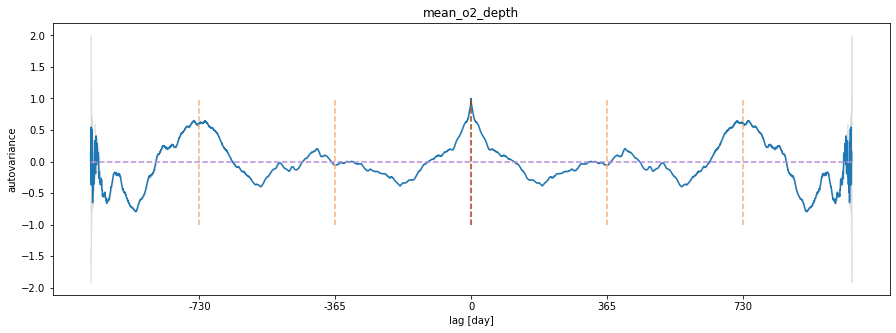

...

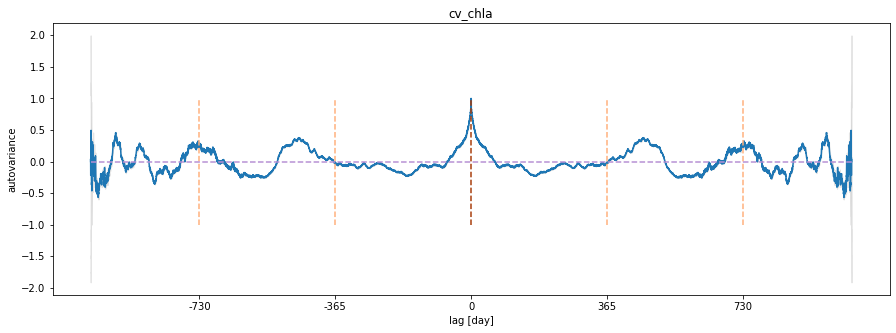

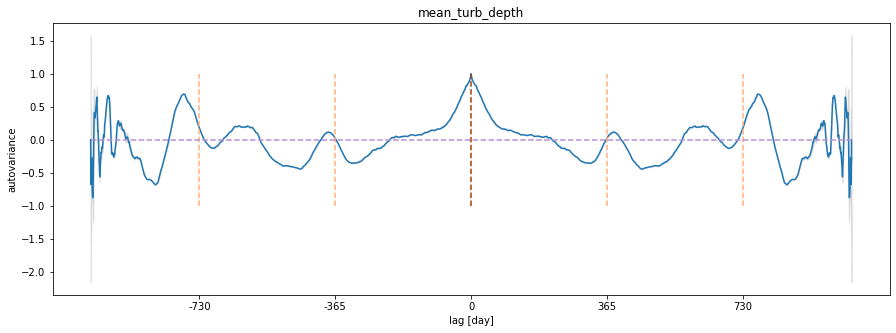

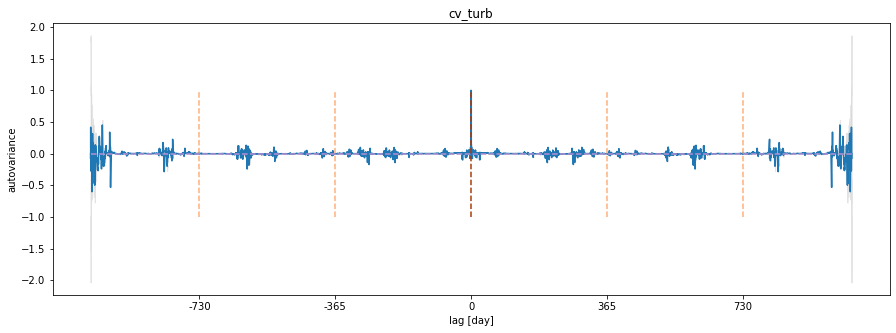

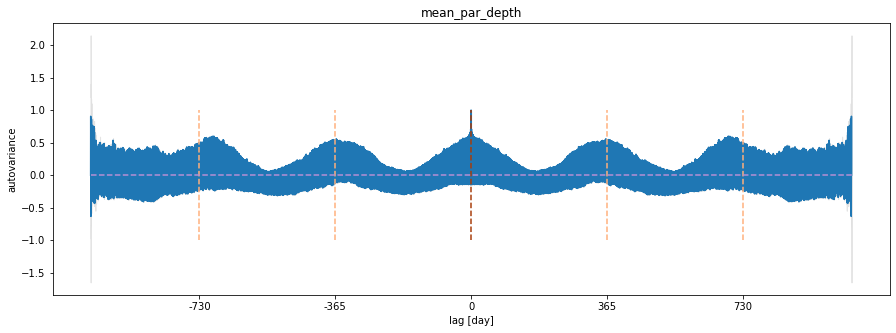

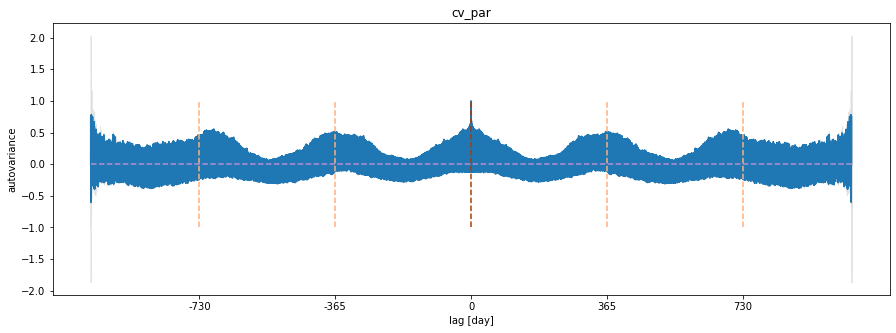

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


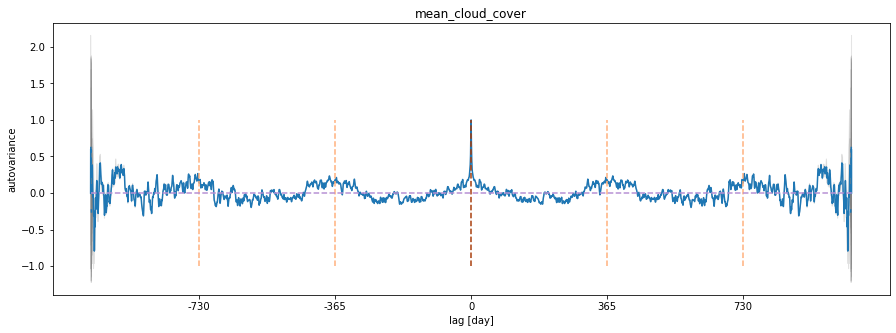

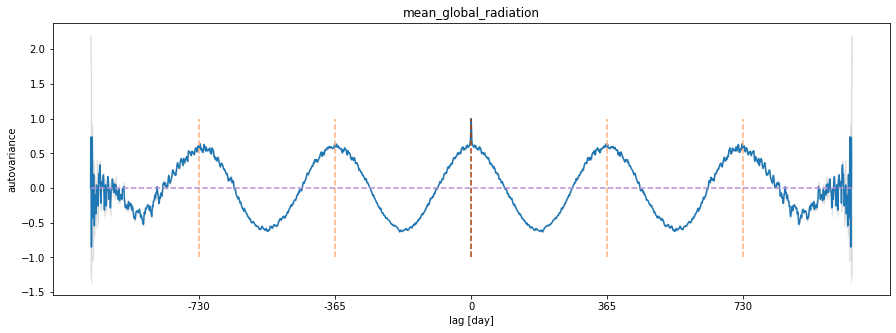

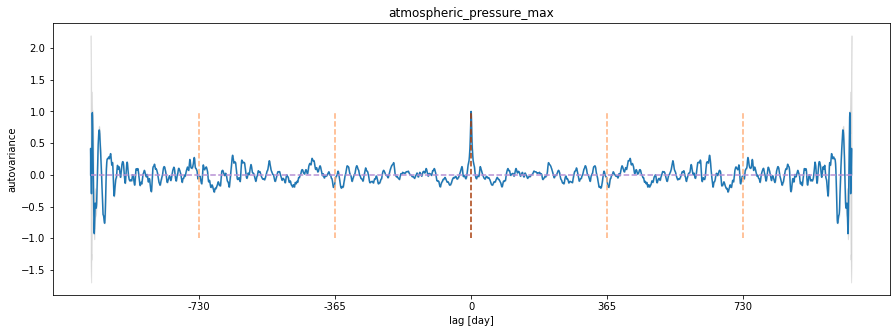

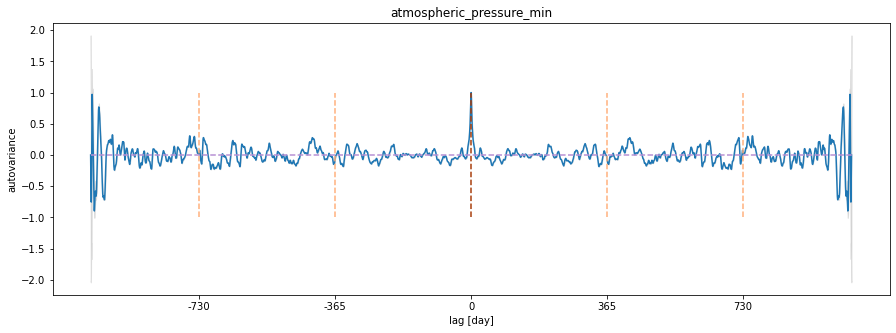

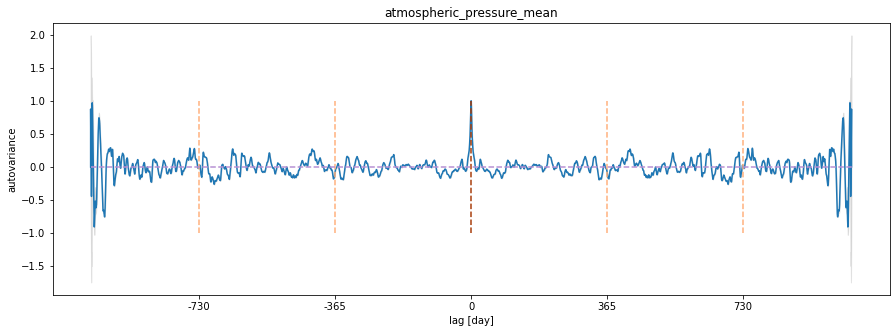

...

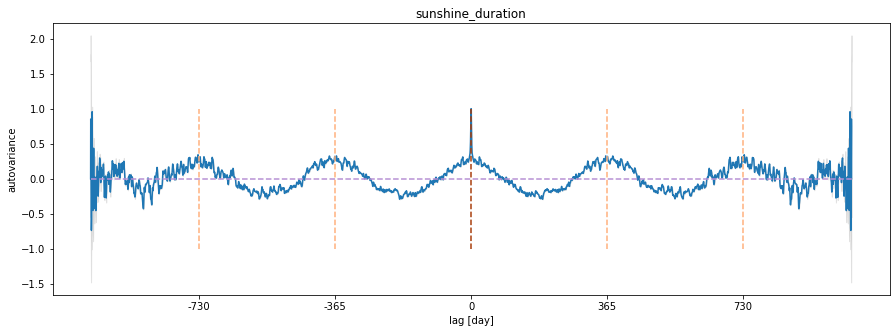

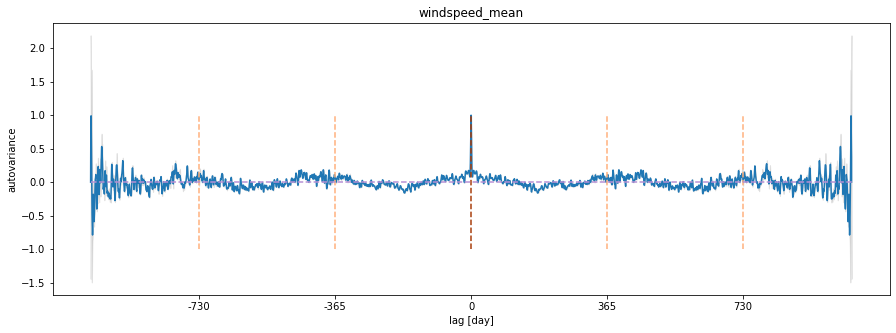

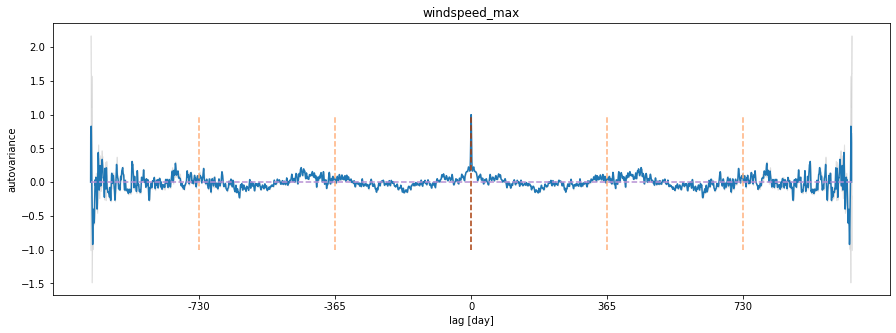

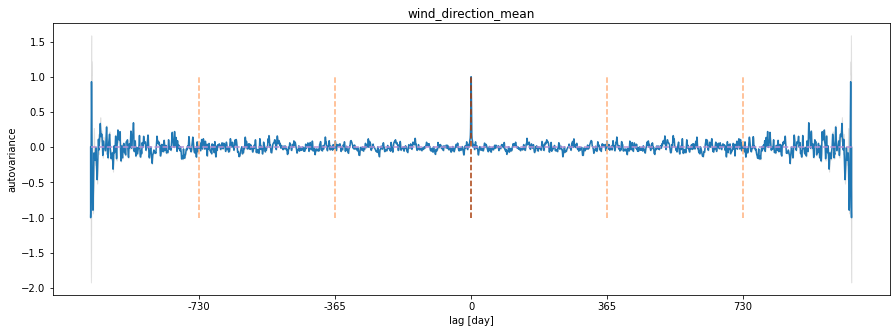

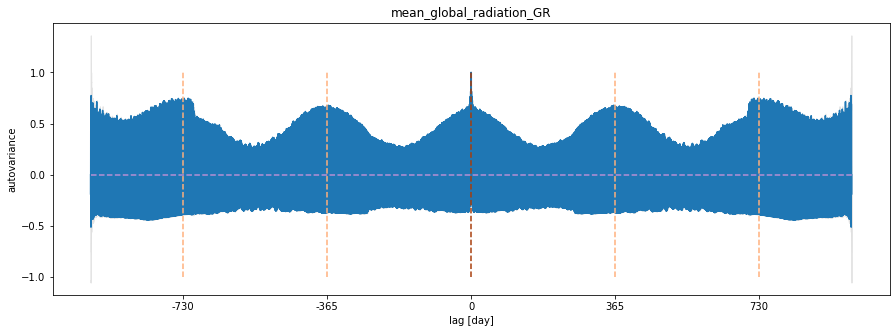

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


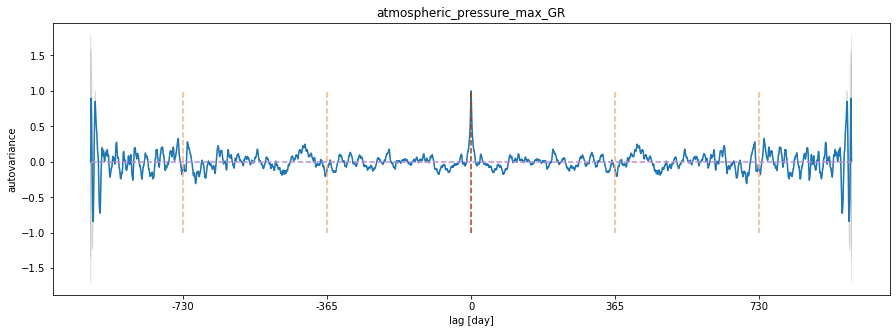

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


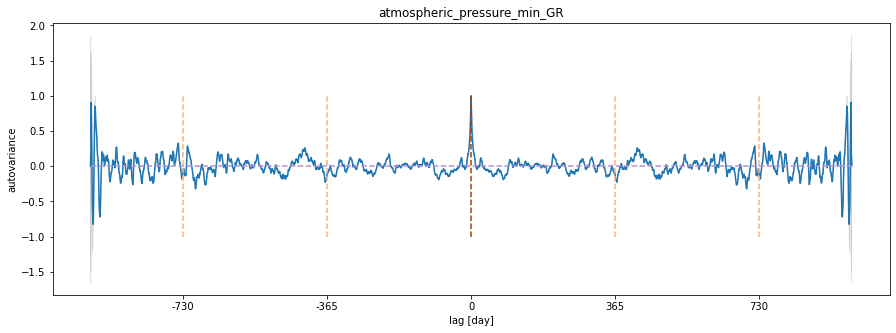

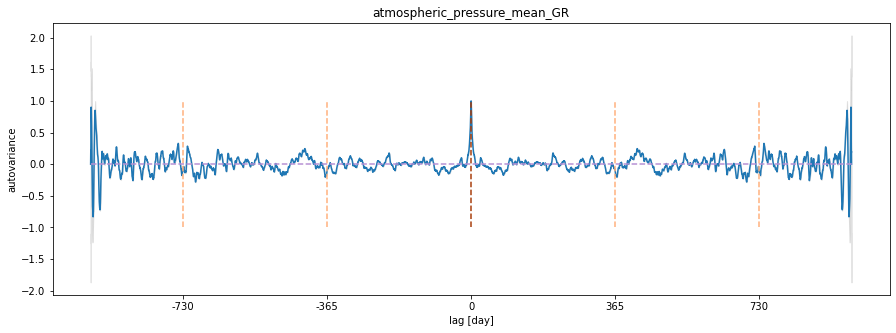

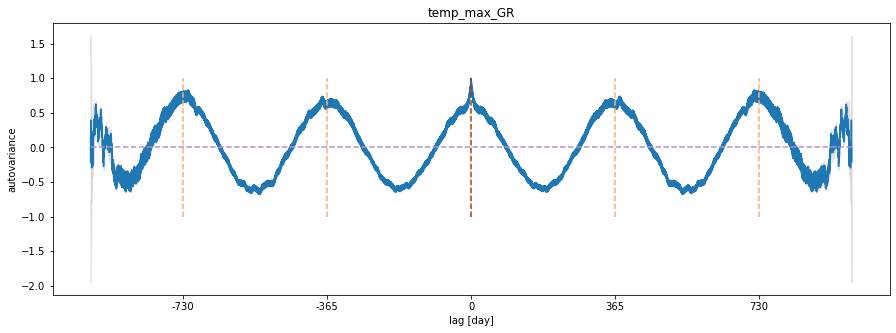

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


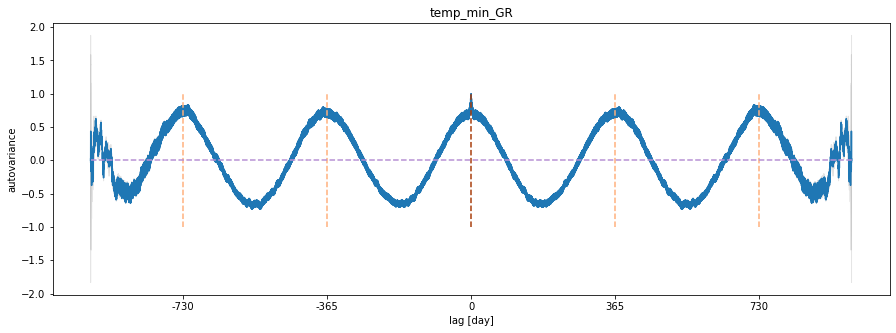

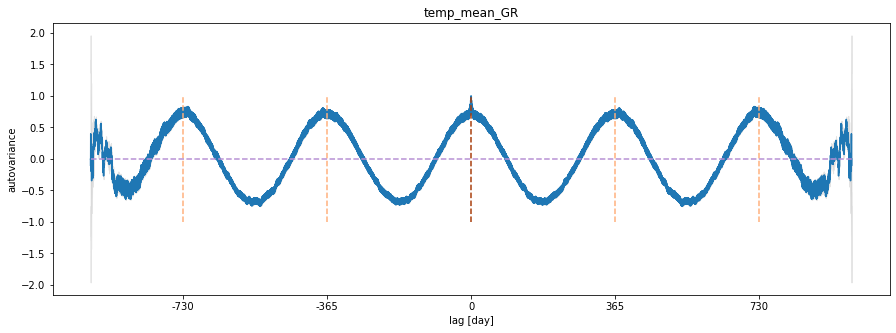

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


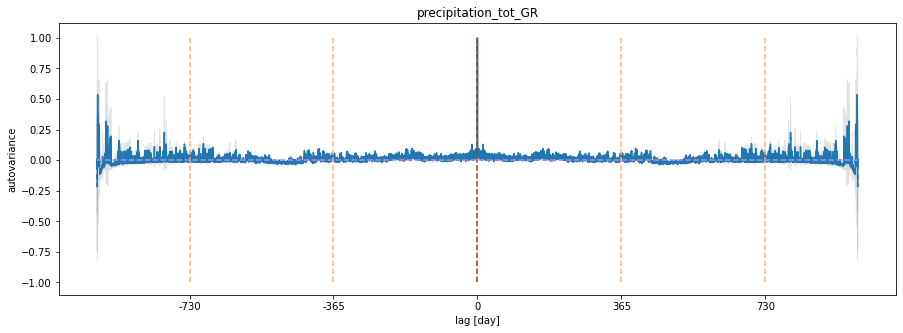

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


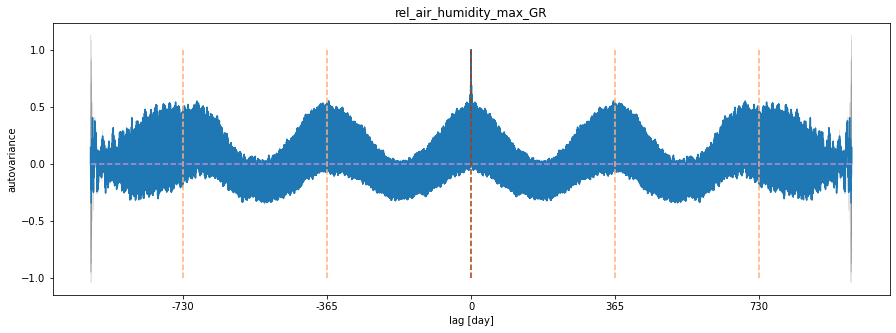

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


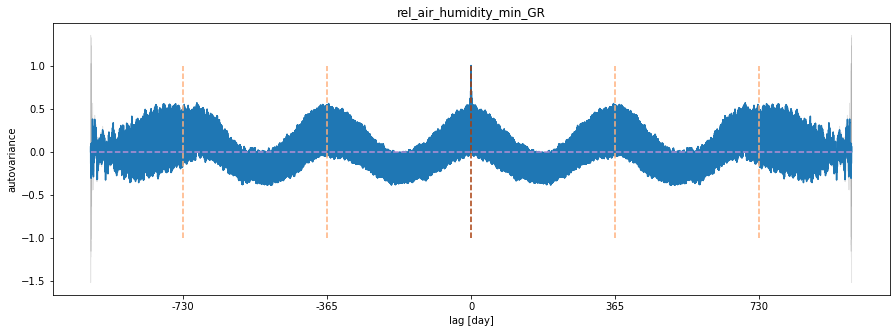

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


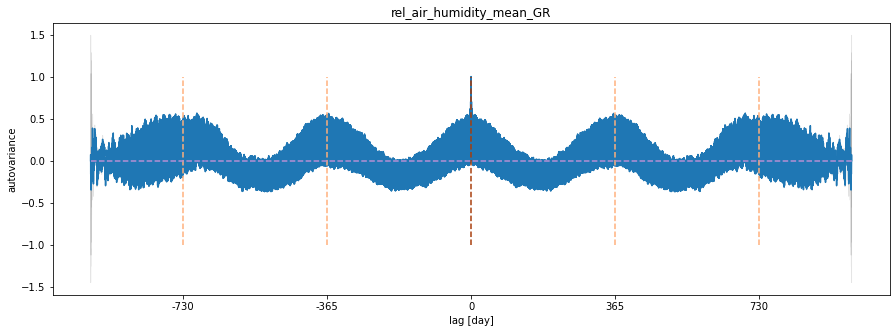

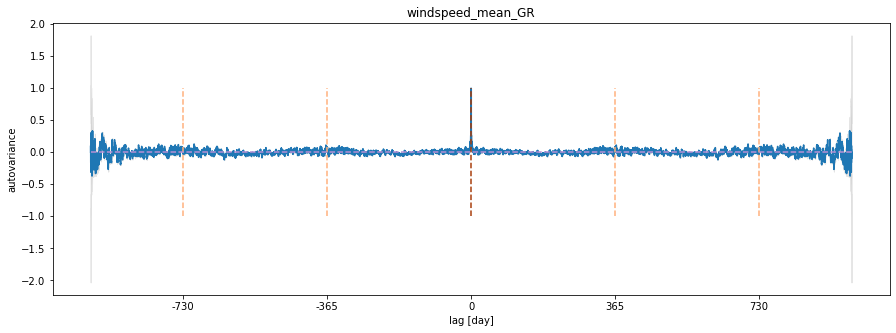

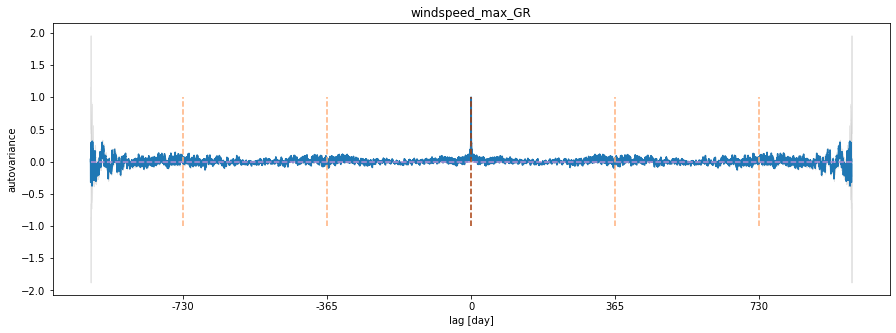

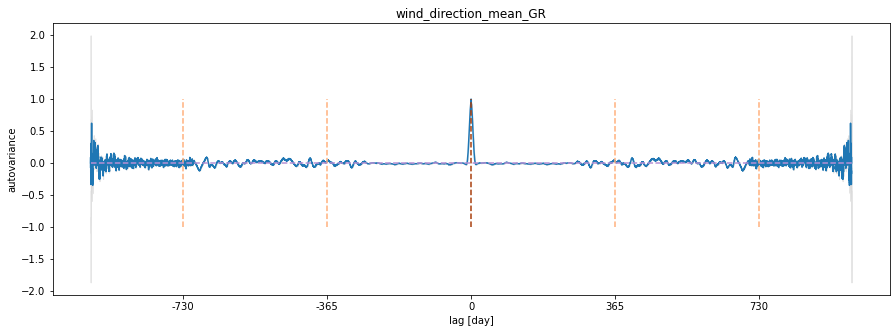

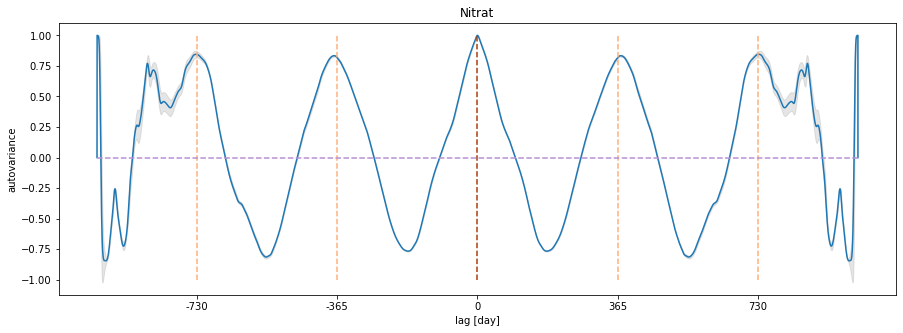

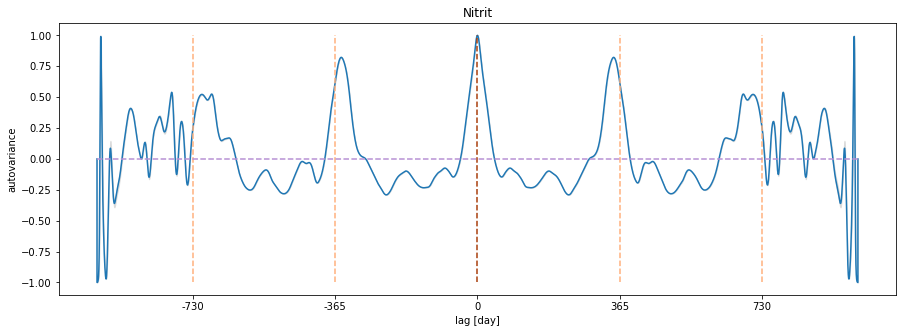

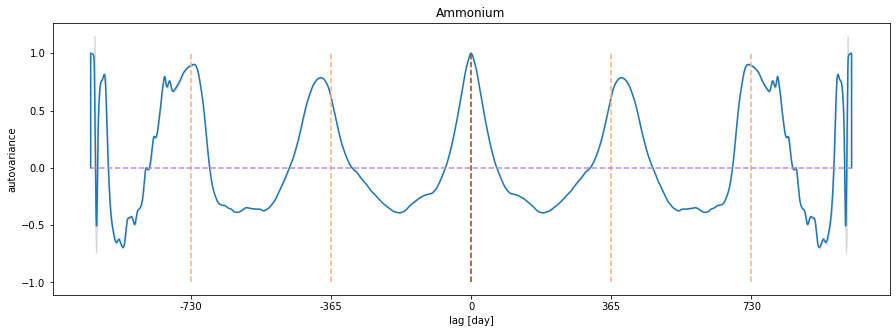

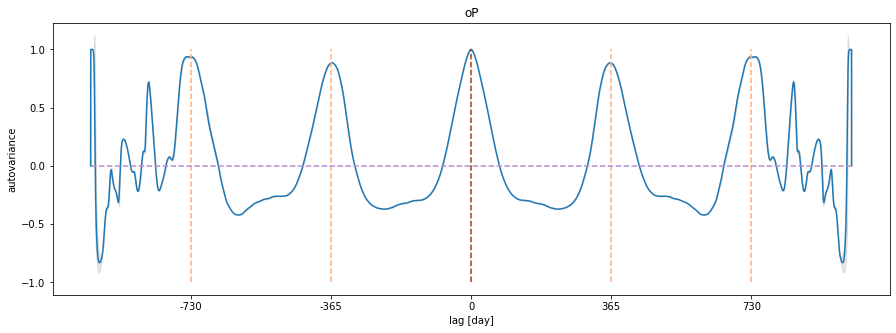

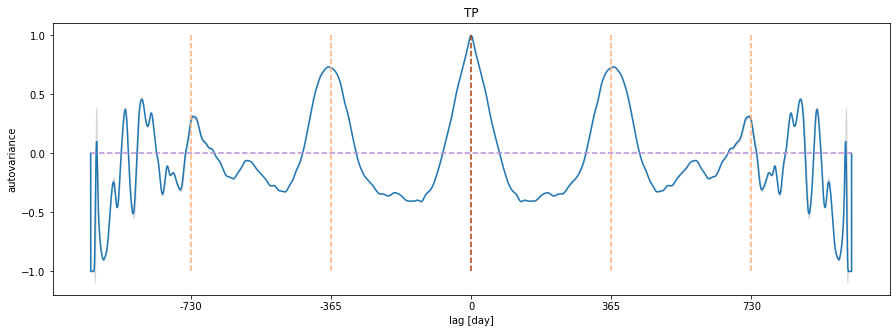

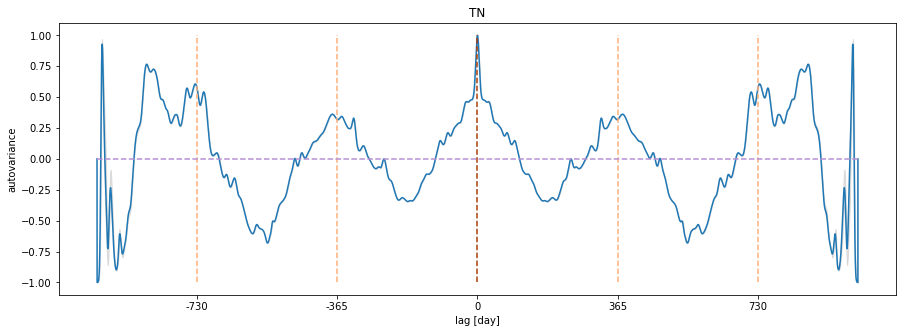

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


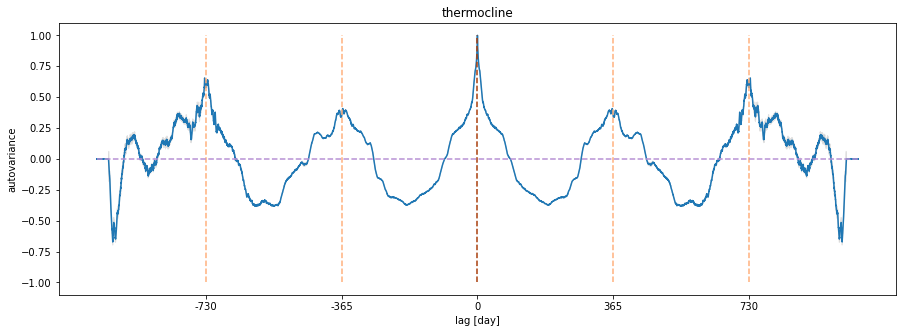

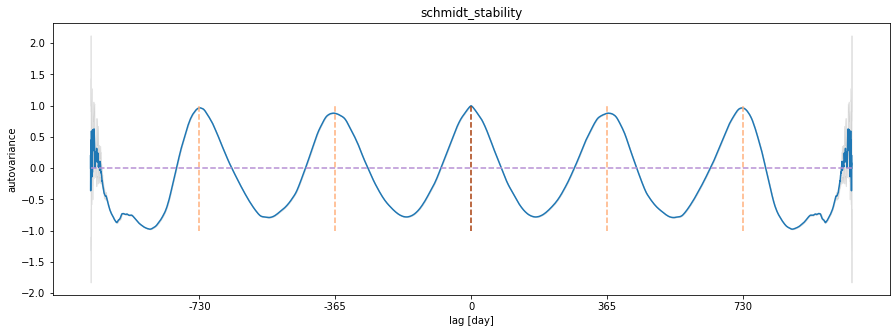

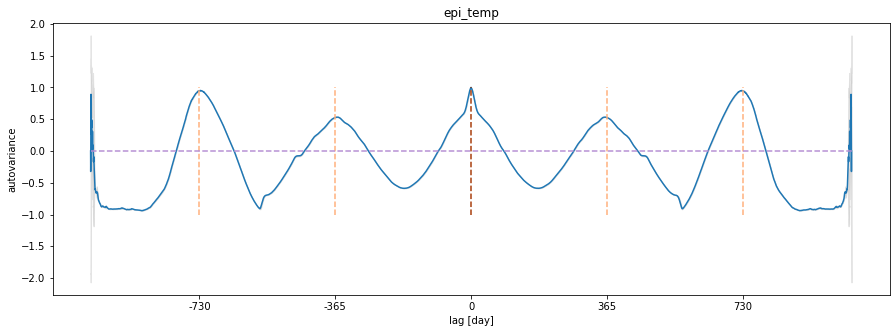

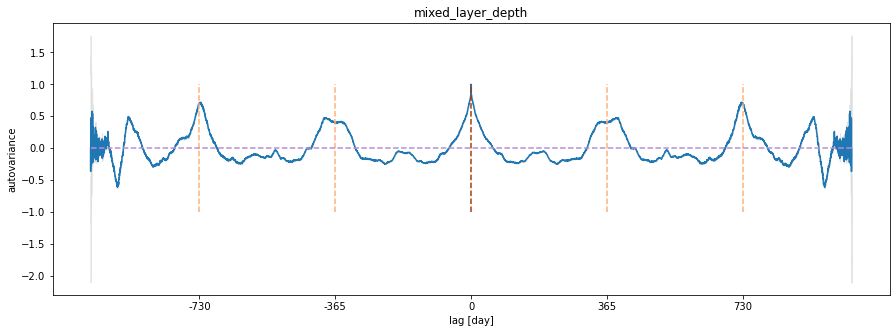

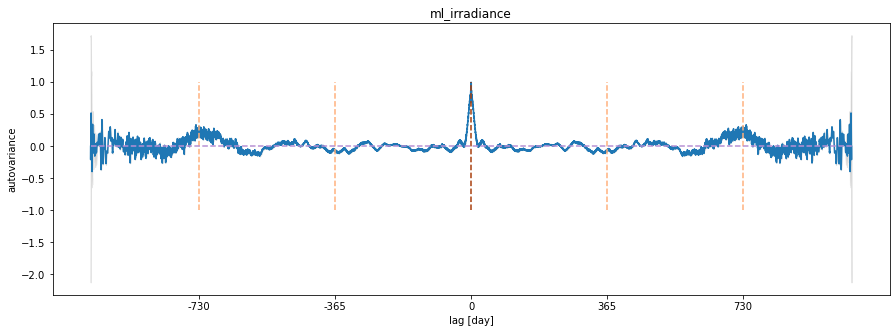

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


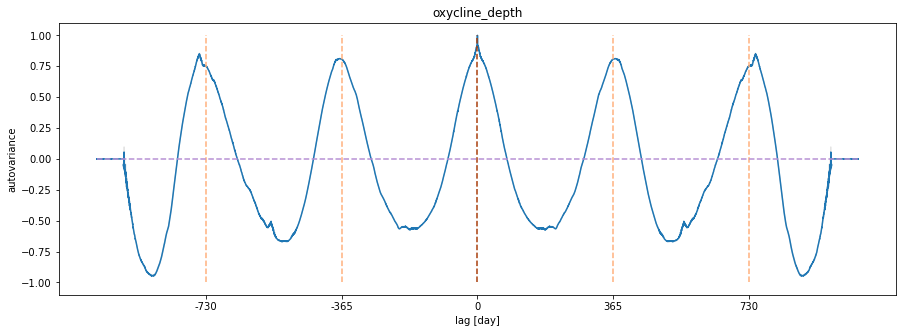

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)


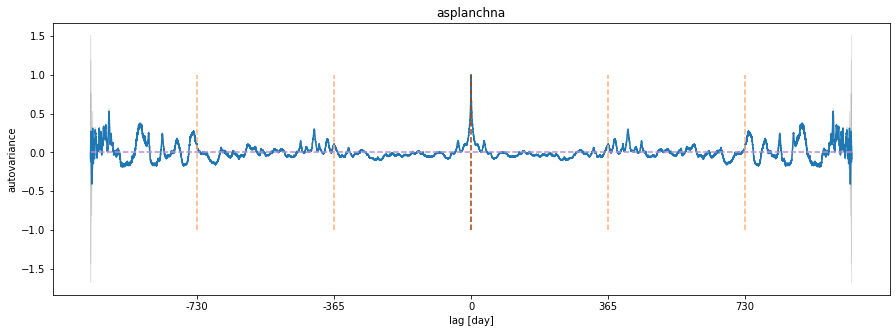

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


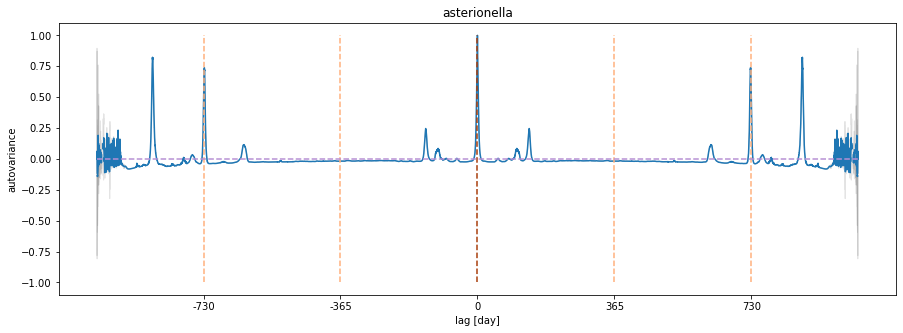

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)


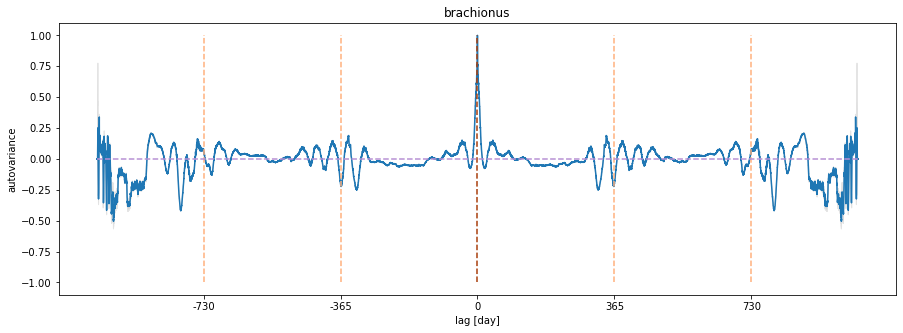

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


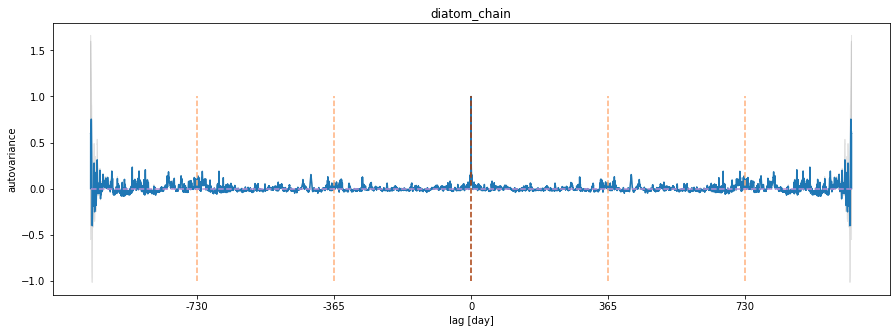

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)


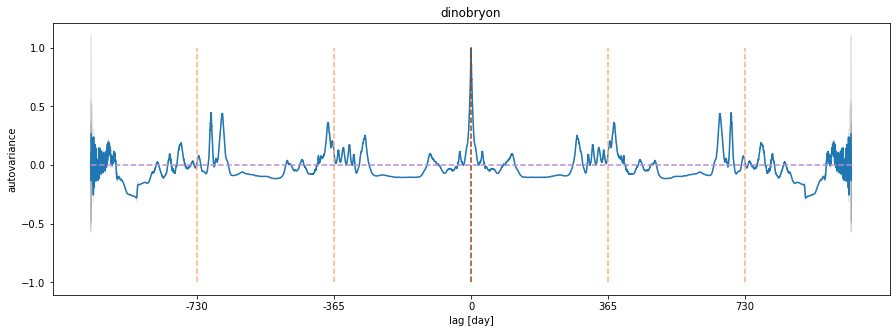

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


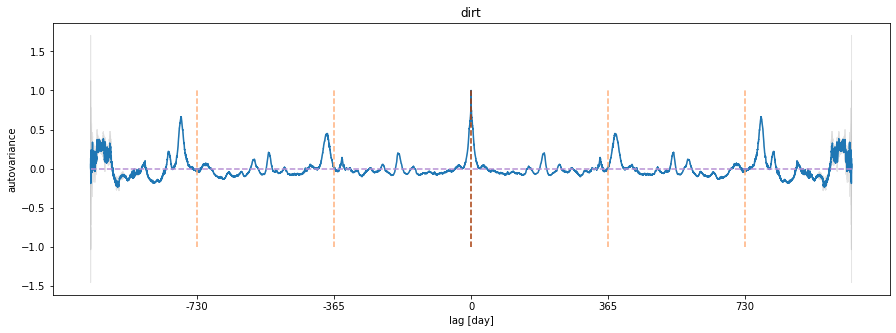

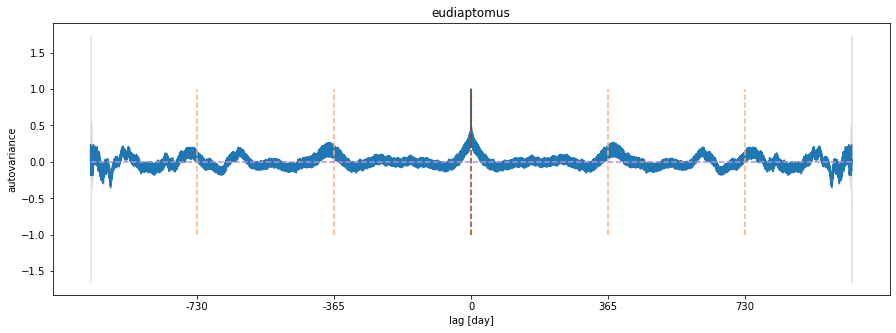

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)


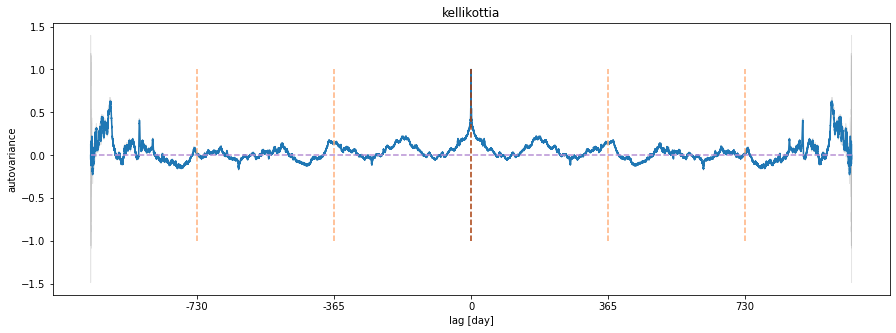

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


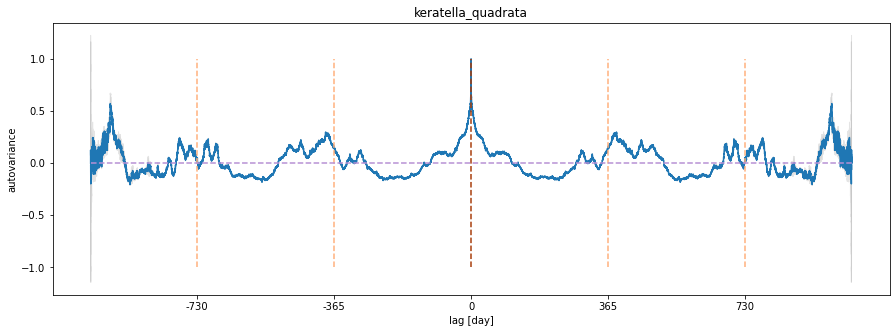

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)


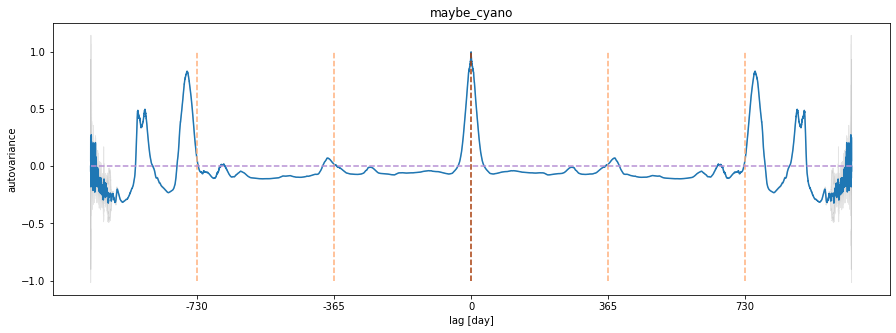

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


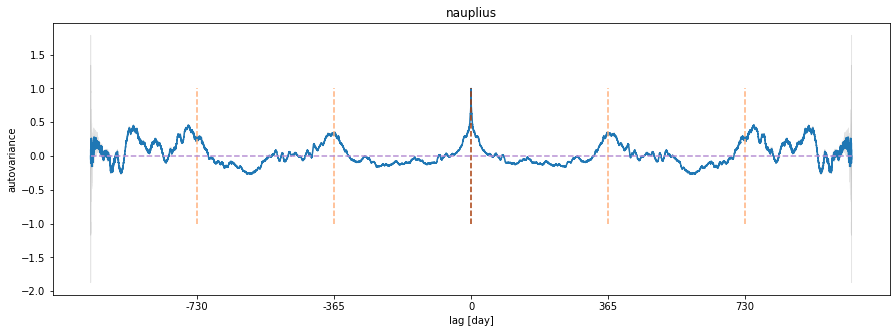

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)


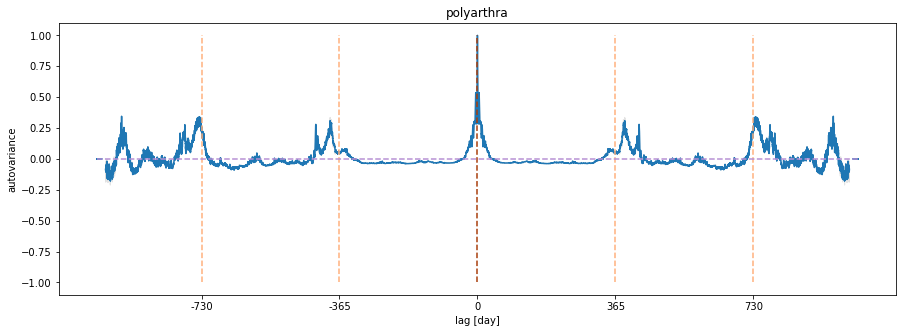

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


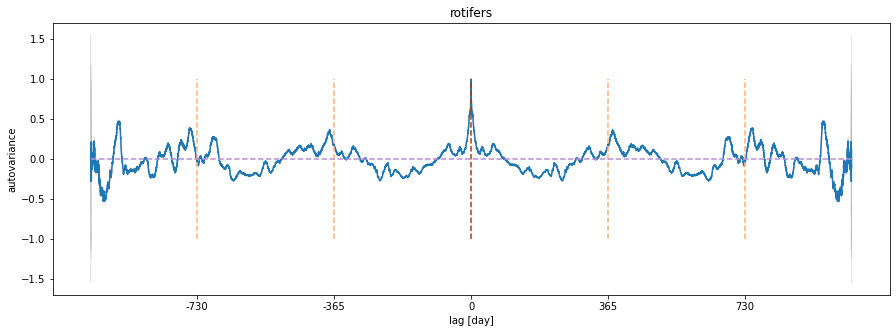

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


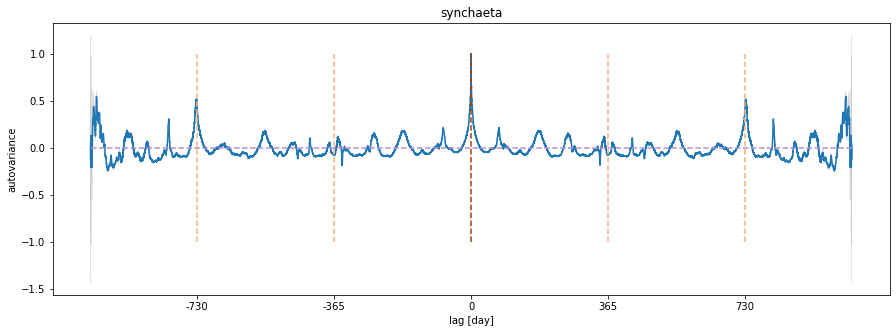

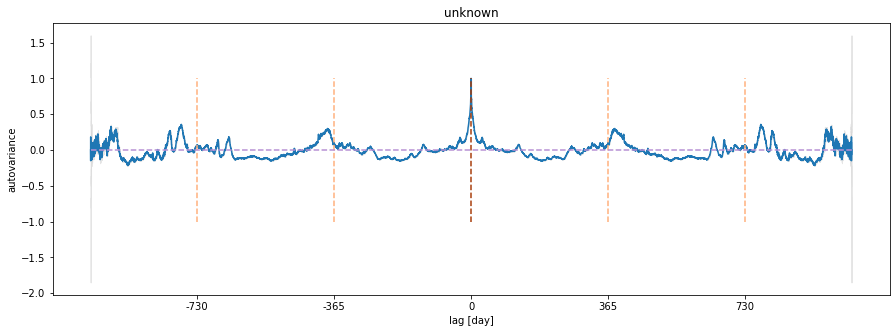

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)


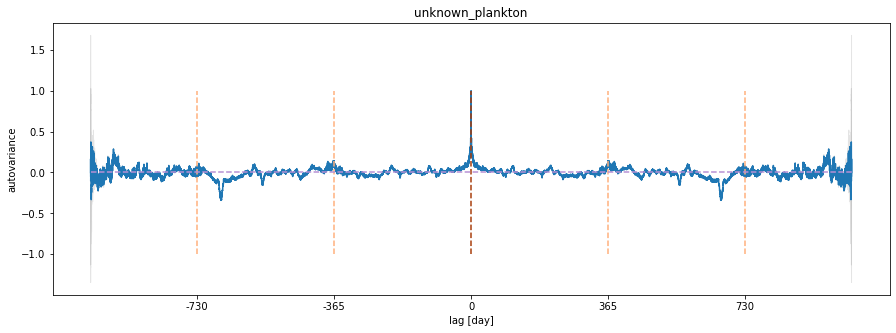

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)


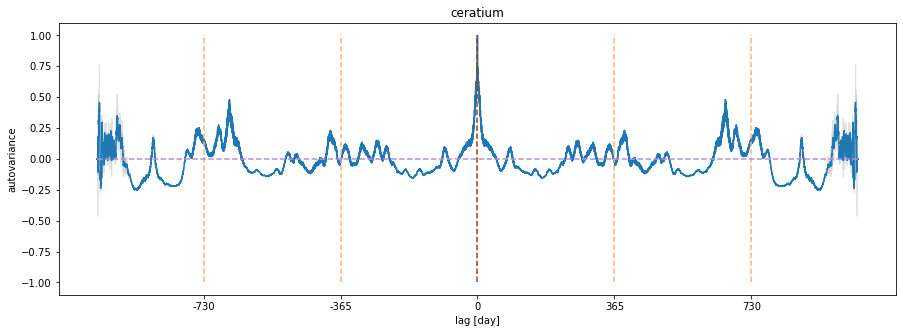

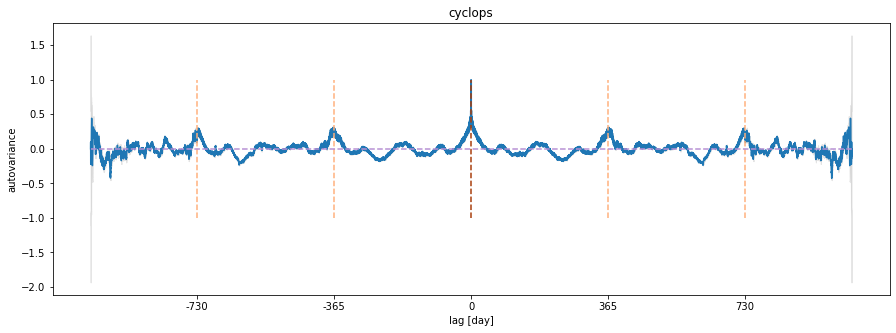

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


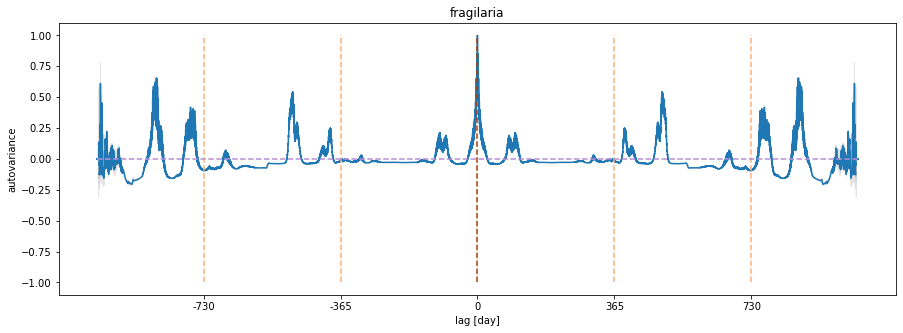

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)


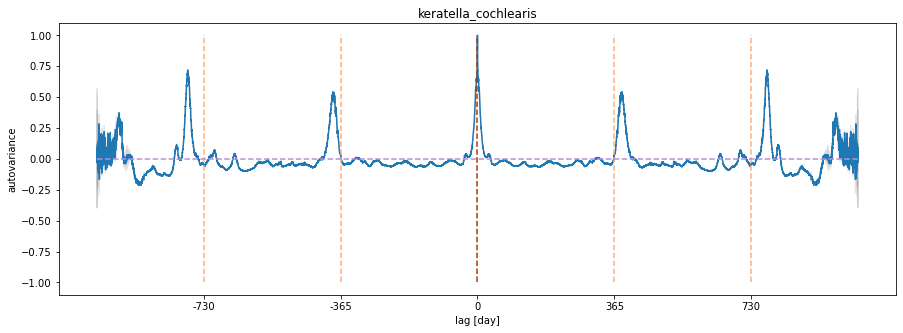

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)


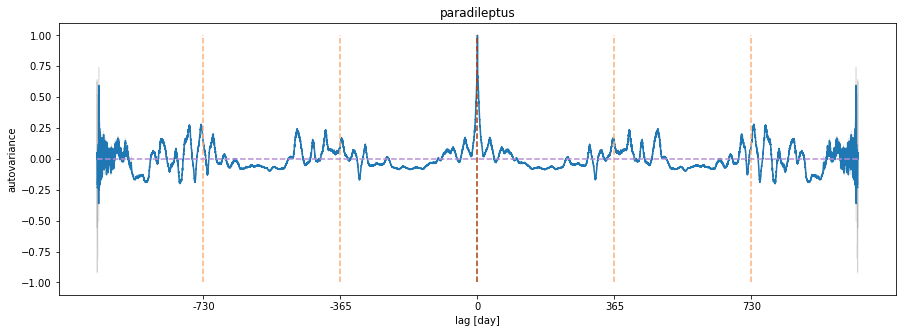

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


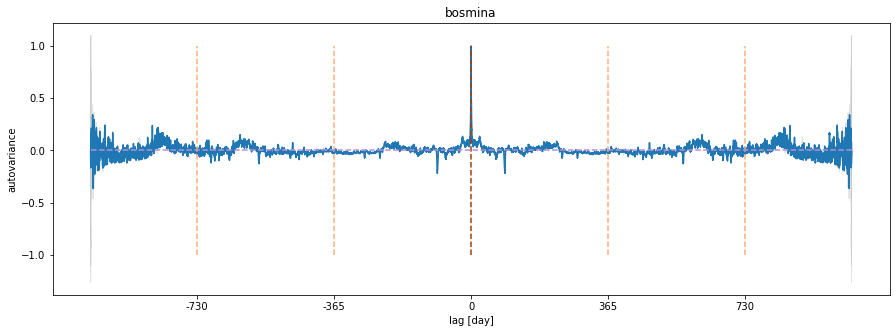

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


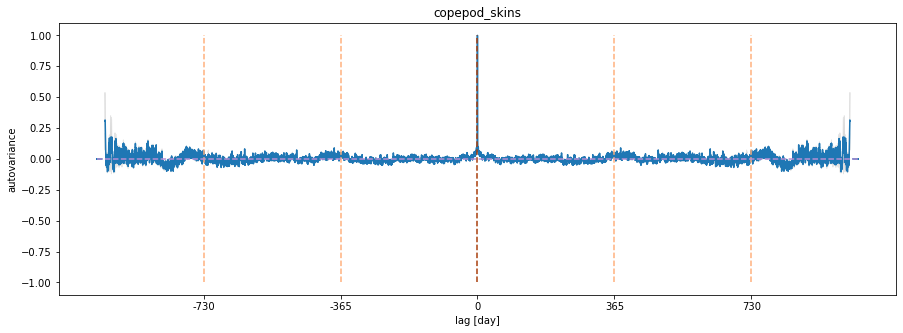

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)


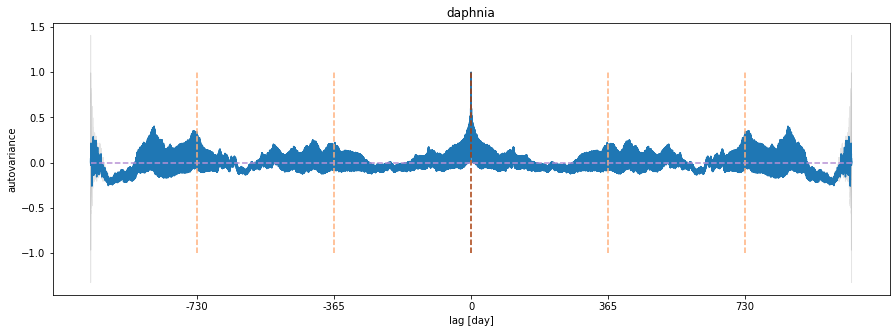

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


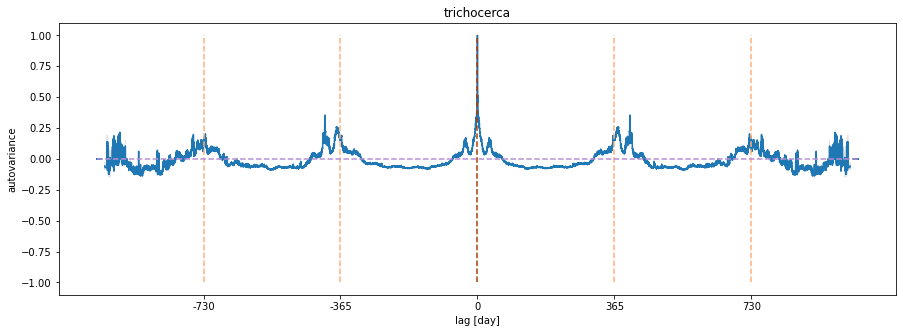

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


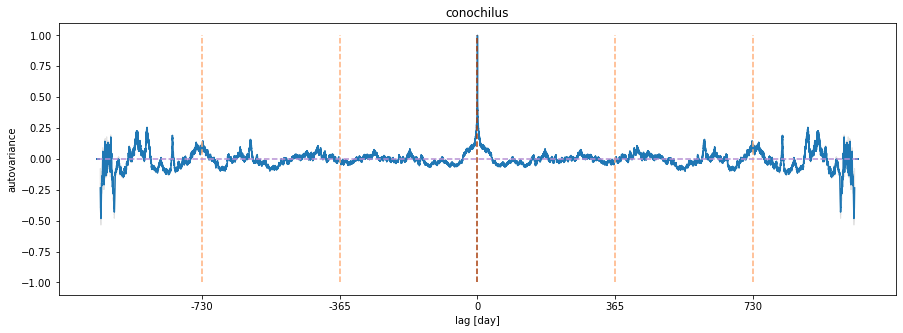

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


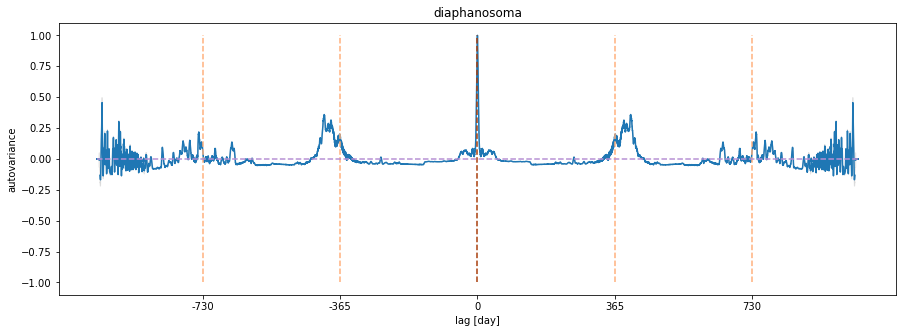

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


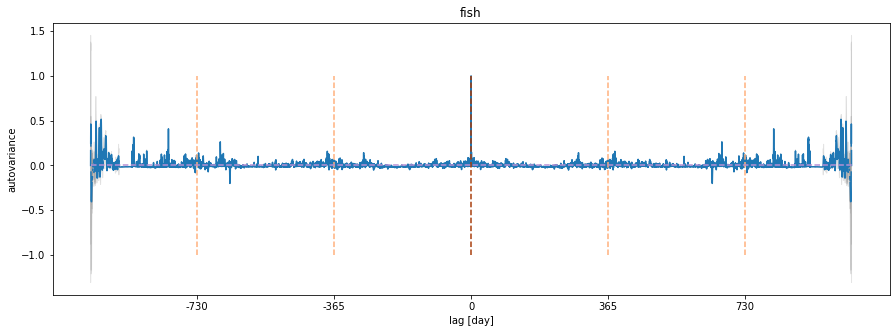

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


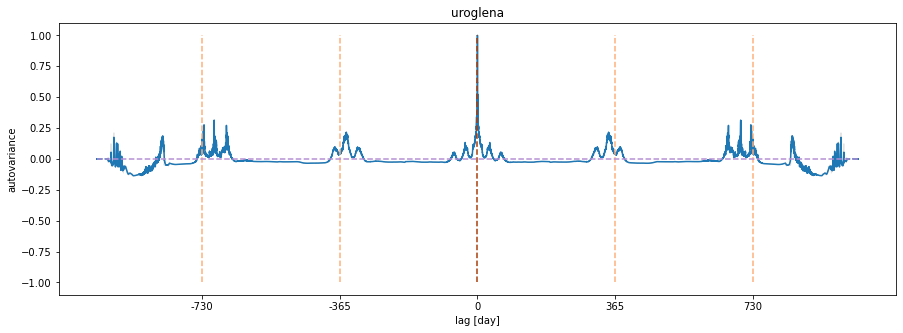

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


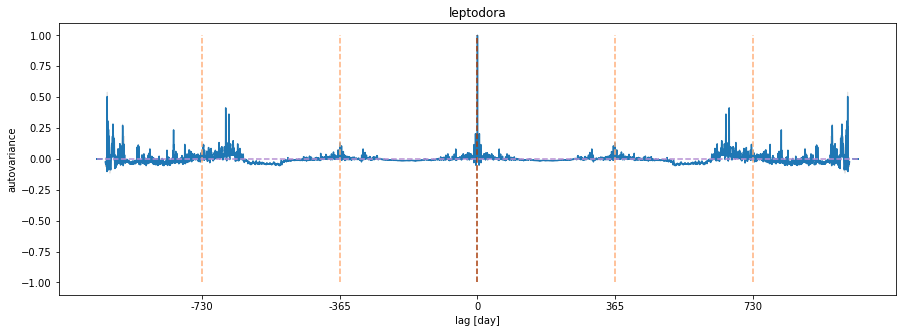

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


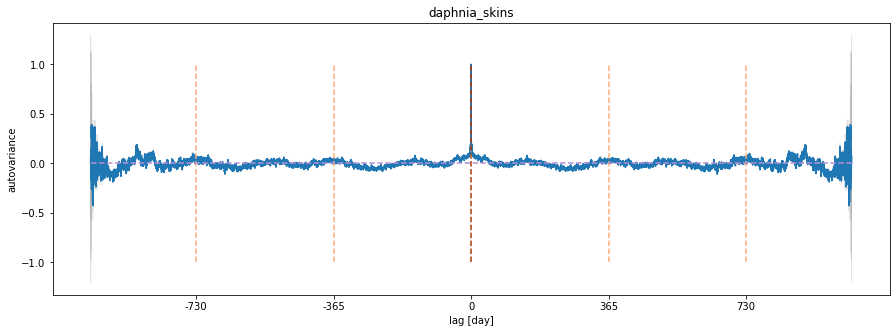

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


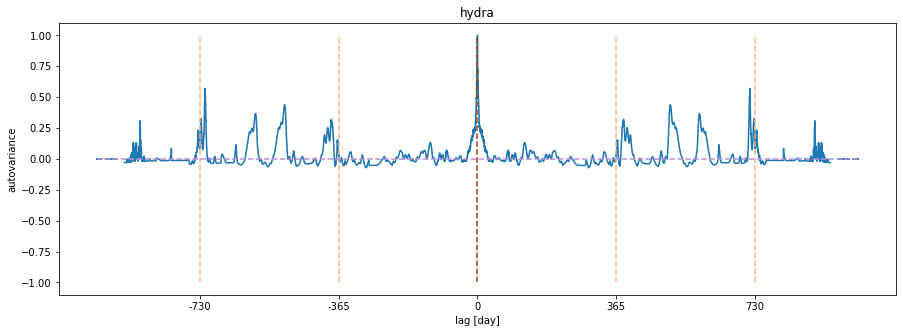

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


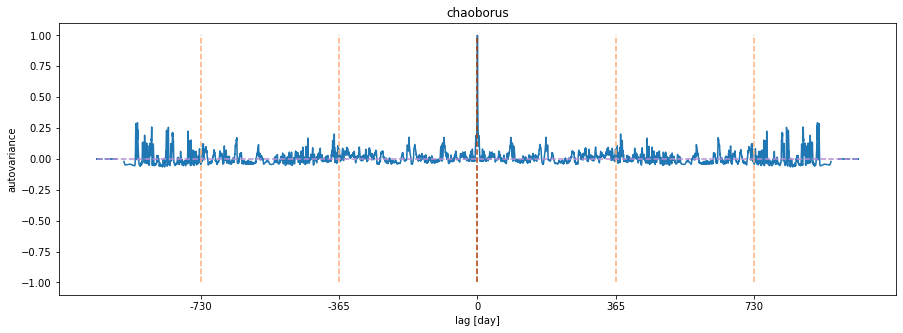

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


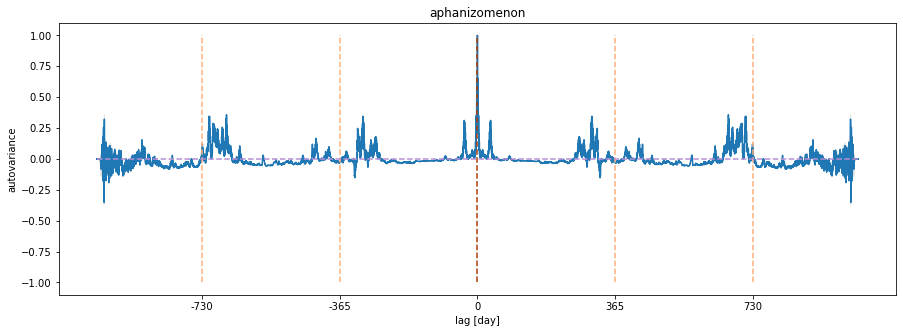

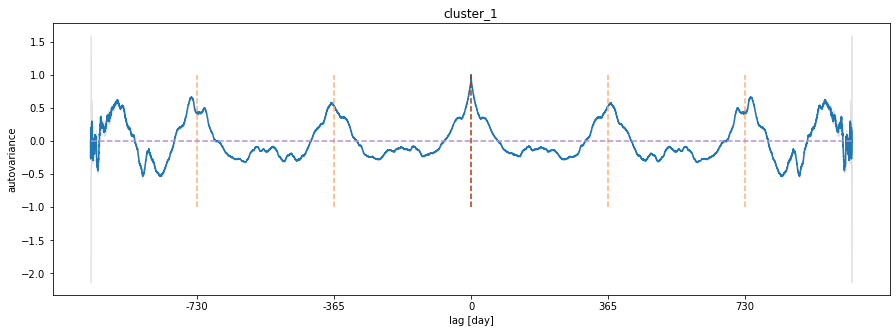

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


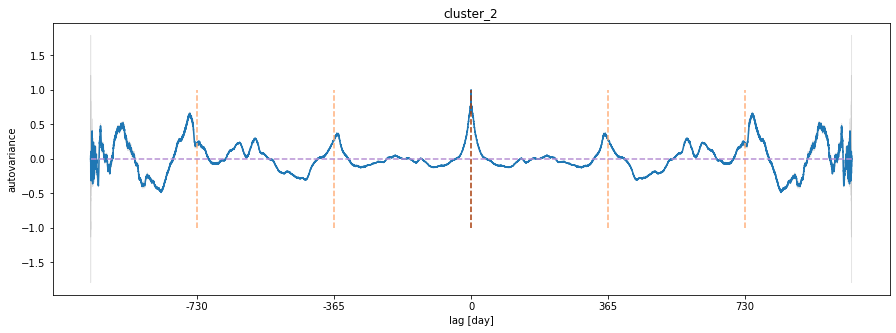

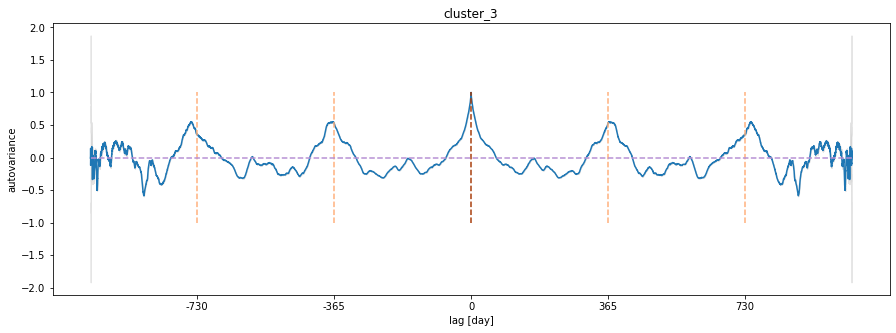

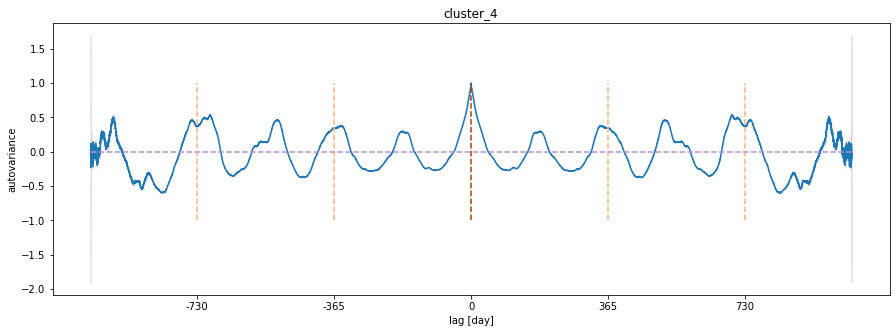

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


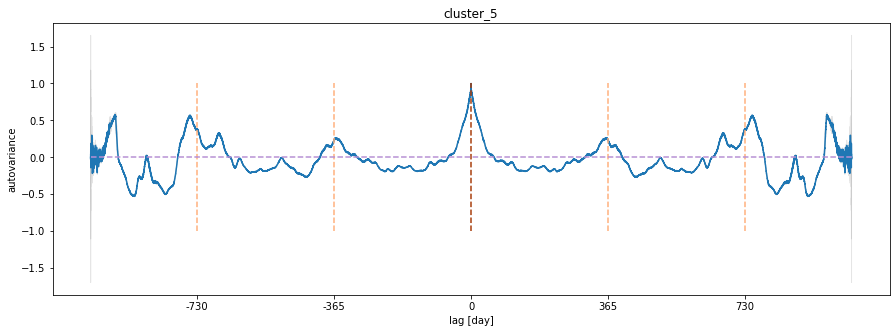

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)


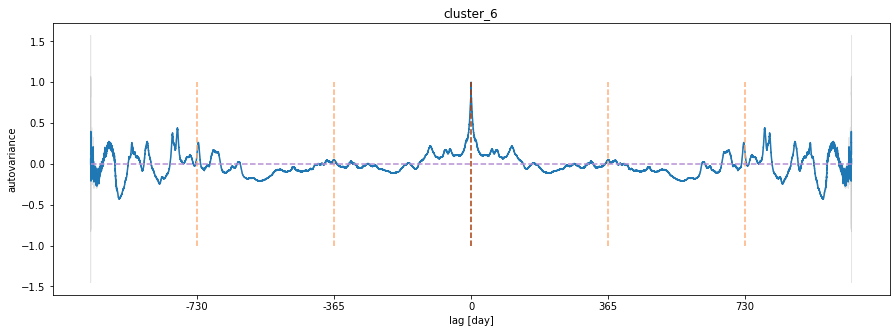

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)


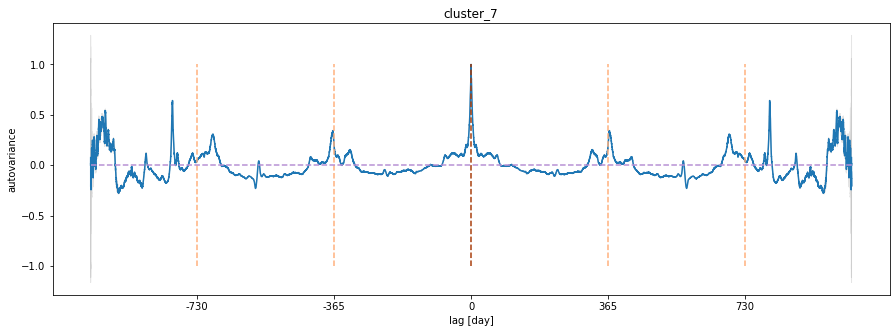

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


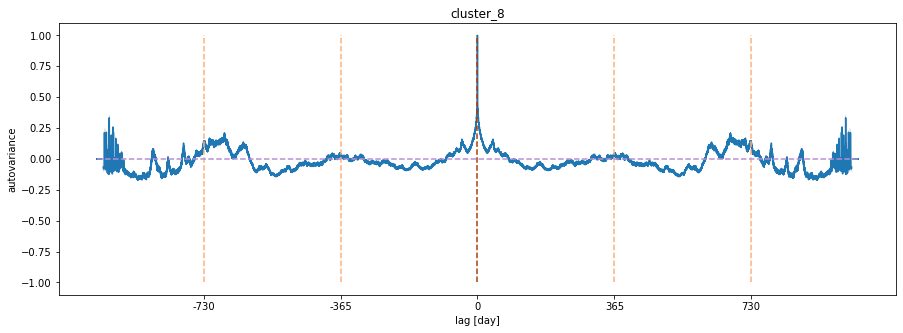

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


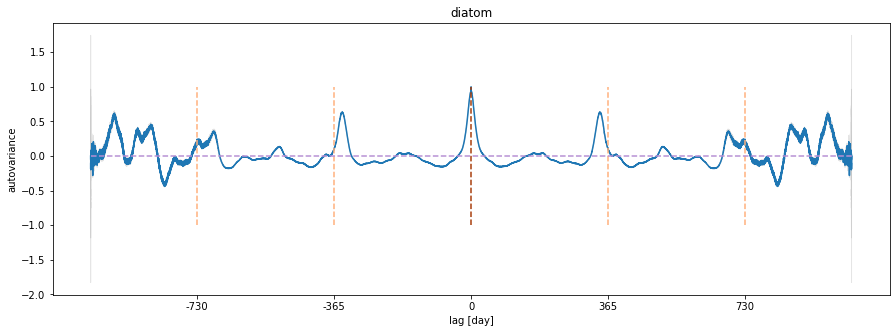

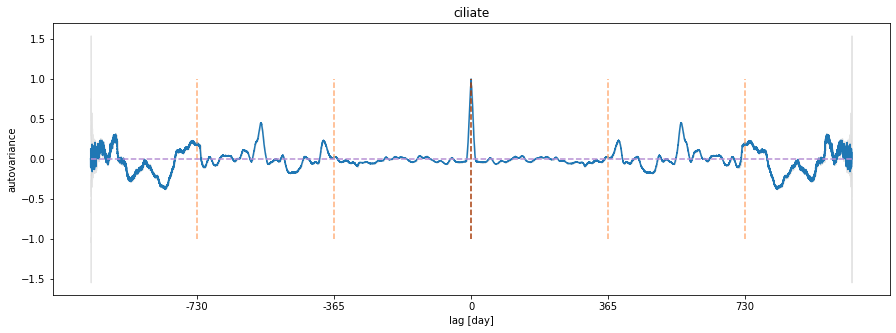

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)


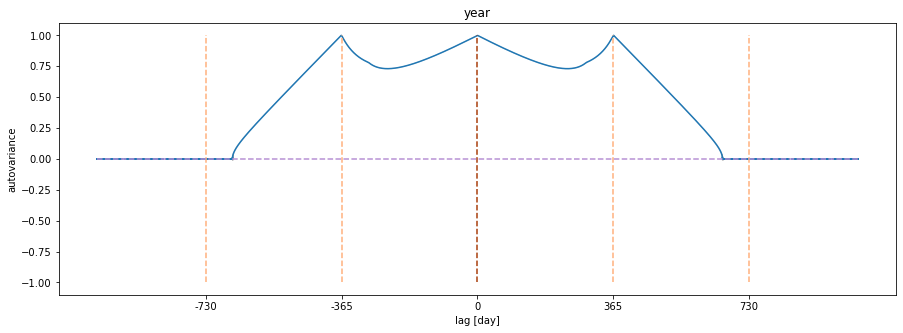

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs


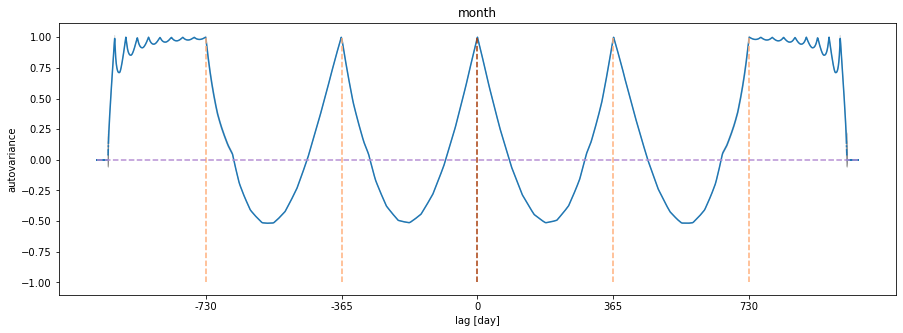

C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:27: RuntimeWarning: invalid value encountered in sqrt
  std2 = np.sqrt(ss2*(c2-1)/c2-mean2*mean2+array[-idx]*array[-idx]/c2)
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:30: RuntimeWarning: Mean of empty slice
  autocor[idx-1]=np.nanmean(input1*input2)#correlate the two inputs
C:\Users\valla\AppData\Local\Temp\ipykernel_2736\1583869673.py:20: RuntimeWarning: invalid value encountered in sqrt
  std1 = np.sqrt(ss1*(c1-1)/c1-mean1*mean1+array[idx-1]*array[idx-1]/c1)


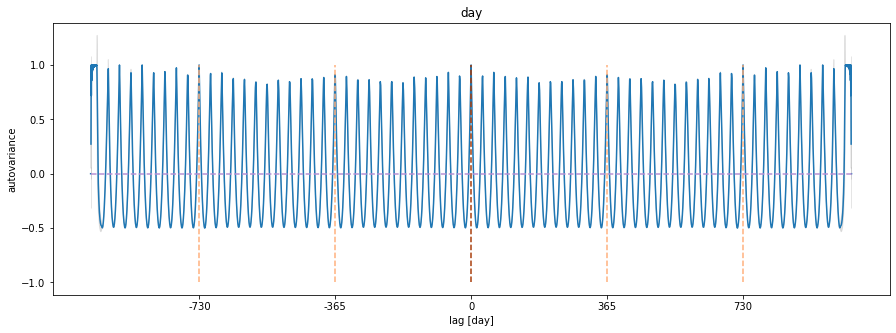

In [103]:
#chose the number of repetitions for each key
n_reps = 48

#
#iterate over the keys
for key in dfi.keys():
    #drop the nans
    serie =dfi[key].dropna()
    #compute the autovariance
    autocor_a,lags = autovar_rep(serie,n_reps)
    #compute the statistics
    mean = np.mean(autocor_a,axis=0)
    std = np.std(autocor_a,axis=0)
    
    
    #plot
    fig,ax = plt.subplots(figsize=(15,5))
    ax.plot(lags,mean)
    shade = ax.fill_between(lags, mean - 1.96*std, mean + 1.96*std,
                            color='gray', alpha=0.2) 
    for k in range(-len(years)+1,len(years)):
        if k==0:
            ax.vlines(0, -1, 1,linestyles='dashed',color='xkcd:rust')
        else:
            ax.vlines(365*24*k, -1, 1,linestyles='dashed',color='xkcd:peach')
    ax.hlines(0,-lags[-1],lags[-1],linestyles='dashed',color='xkcd:pale purple')
    ax.set_xticks(np.linspace(-365*2*24,365*2*24,5))
    ax.set_xticklabels(np.linspace(-365*2,365*2,5,dtype=int))
    ax.set_xlabel('lag [day]')
    ax.set_ylabel('autovariance')
    ax.set_title(key)
    ax.set_ylim(-1.1, 1.1)

    plt.show()

## Rolling window:
From previous work, it can be assumed that the autocorrelation is dependent on the season, so a based on the recomputation normalization, one could check the importance of the starting date on the resulting autocorrelation.

In [12]:
def windowed_cor(df,key1,key2,window_size,max_lag,epsilon=0.0001):
    cor = np.zeros((max_lag,len(df)-window_size-max_lag))
    dfd = df.drop('Datetime',axis=1,errors='ignore')
    for start in range(len(df)-window_size-max_lag):
        for lag in range(max_lag):
            input1=dfd[key1][start:start+window_size]
            input1.interpolate(method='linear', limit_direction='forward', axis=0)
            input1=input1-input1.mean()
            input1.reset_index(drop=True,inplace=True)
            input2=dfd[key2][start+lag:start+window_size+lag]
            input2.interpolate(method='linear', limit_direction='forward', axis=0)
            input2=input2-input2.mean()
            input2.reset_index(drop=True,inplace=True)
            
            cor[lag,start] =(input1*input2).mean()/(input1.std()*input2.std()+epsilon)
    
            
    return cor

In [15]:
max_lag  = 180
cor15 = windowed_cor(dfi,'mean_chla','mean_chla',15,max_lag)
cor30 = windowed_cor(dfi,'mean_chla','mean_chla',30,max_lag)
cor90 = windowed_cor(dfi,'mean_chla','mean_chla',90,max_lag)
cor180 = windowed_cor(dfi,'mean_chla','mean_chla',180,max_lag)
cor365 = windowed_cor(dfi,'mean_chla','mean_chla',365,max_lag)

In [16]:
croscor30 = windowed_cor(dfi,'mean_temp','mean_chla',30,max_lag)

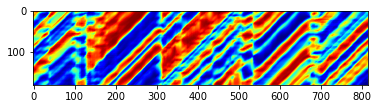

In [17]:
plt.imshow(croscor30,cmap='jet')

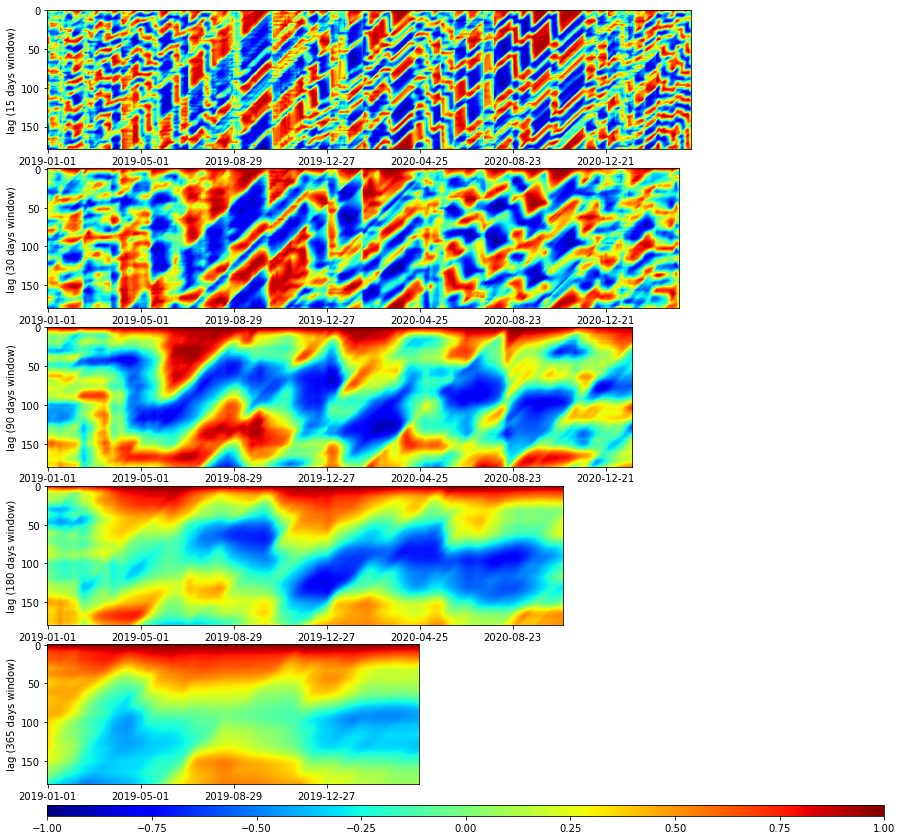

In [18]:
from matplotlib.backends.backend_pdf import PdfPages
pp = PdfPages('autocor_windowed.pdf')

img_list = [cor15,cor30,cor90,cor180,cor365]
name_list = [15,30,90,180,365]
padding = 30
w = 15
n = max(30+len(img_list)*padding+sum([img.shape[0] for img in img_list]),cor15.shape[1])
fig = plt.figure(figsize=(15,15))

gs = fig.add_gridspec(n,n)
axs=[]
ori = 0
for cor,name in zip(img_list,name_list):
    end = ori+padding+cor.shape[0]
    ax = fig.add_subplot(gs[ori:end,:cor.shape[1]])
    ori = end
    xticks = np.arange(0,cor.shape[1],120)
    ax.set_xticks(xticks)
    ax.set_xticklabels([el.date() for el in time_df[xticks]])
    ax.set_ylabel(f"lag ({name} days window)")
    axs.append(ax)
    img = ax.imshow(cor,cmap=plt.get_cmap('jet'),vmin=-1.,vmax=1.,aspect='equal')


ax_cb = fig.add_subplot(gs[ori+15:ori+30,:],)
fig.colorbar(img,cax=ax_cb,orientation='horizontal')
pp.savefig()
pp.close()
plt.show()

To allow an easier observation, the plots can be checked separately below:

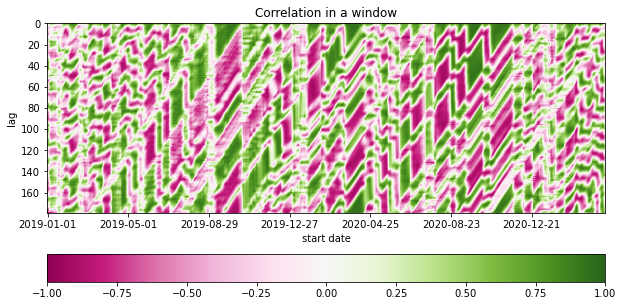

In [259]:
cor = cor15
fig,ax = plt.subplots(1,figsize=(10,5))
im = ax.imshow(cor,cmap=plt.get_cmap('PiYG'),vmin=-1.,vmax=1.,aspect='auto')
xticks = np.arange(0,cor.shape[1],120)
ax.set_xticks(xticks)
ax.set_xticklabels([el.date() for el in time_df[xticks]])
ax.set_xlabel("start date")
ax.set_ylabel("lag")
ax.set_title("Correlation in a window")
plt.colorbar(im,orientation='horizontal')

In case one wants to compare a perticular date accros the years, it is possible to simply put the wanted date down there

In [ ]:
n_day = 140 #days since january the first
cor = cor15


plot_interactive(n_day,cor=cor)
plt.show()


To better understand the meaning of these images, a small animation allows to observe the variation of the autocorrelation function as the starting date changes. 

In [ ]:
cor = cor90


fig = plt.figure(figsize=(10,6))
gs = fig.add_gridspec(2, 30)
axs=[]
axs.append(fig.add_subplot(gs[0,:]))
axs.append(fig.add_subplot(gs[1,:-1]))
axs.append(fig.add_subplot(gs[1,-1]))
n_day  = 0
dates = np.arange(n_day,cor.shape[1],365)
cory = cor[:,dates]
# plot of the correlation
ax = axs[0]
lines = []
for corat in cory.T:
    line, = ax.plot(range(len(corat)),corat)
    lines.append(line)
ax.set_xlabel("Lag [day]")
ax.set_ylabel("Autocorrelation")
ax.set_ylim(-1.2,1.2)
mean = np.mean(cory,axis=1)
std = np.std(cory,axis=1)
shade = ax.fill_between(range(cory.shape[0]), mean - 1.96*std, mean + 1.96*std,
                        color='gray', alpha=0.2)

ax.legend([2019+el for el in range(cory.shape[1])]+["95% confidence interval"],loc='upper right')
ax.hlines(0,0,cory.shape[0],linestyles='dashed',color='black')
title = ax.set_title('')

#heat map with lines
ax = axs[1]
img = ax.imshow(cor,cmap='RdGy',vmin=-1,vmax = 1)

col = plt.cm.tab10([0.0,0.1,0.2])
vlines = []
for date in dates:
    vlines+=ax.plot([date,date],[0,cor.shape[0]-1],linestyle='dashed',
                          linewidth=4)
days = np.arange(0,cor.shape[1])
xticks = days[[el.is_month_start for el in time_df[:cor.shape[1]]]][::6]
ax.set_xticks(xticks)
ax.set_xticklabels([el.month_name()[:3]+f" {el.year}"
                    for el in time_df[xticks]])
ax.set_xlabel("start date")
ax.set_ylabel("lag")
#color bar
plt.colorbar(cax = axs[2],mappable=img,shrink=0.5,)


def animate(n_day):
    dates = np.arange(n_day,cor.shape[1],365)
    cory = cor[:,dates]
    #hide the lines when they go out of the frame
    if len(dates)<len(lines):
        for line in lines[len(dates)-len(lines):]:
            line.set_visible(False)
        for vline in vlines[len(dates)-len(lines):]:
            vline.set_visible(False)
            
    for line,vline,date in zip(lines,vlines,dates):
        line.set_ydata(cor[:,date])
        vline.set_xdata(date)
    
    mean = np.mean(cory,axis=1)
    std = np.std(cory,axis=1)
    newshade = axs[0].fill_between(range(cory.shape[0]), mean - 1.96*std, mean + 1.96*std,
                        color='gray', alpha=0.0)
    shade.set_paths([newshade.get_paths()[0].vertices])
    
    title.set_text(f"Autocorrelation starting on the"+
                   f" {str(df['day'][n_day]).zfill(2)}/{str(df['month'][n_day]).zfill(2)}")
    return [line for line in lines]+[vline for vline in vlines]+[shade]+[title]
ani = animation.FuncAnimation(
    fig, animate,frames = range(0,365,3), interval=100, blit=False, save_count=50)

plt.close(fig)

HTML(ani.to_jshtml())

In [22]:
file = open("animation.html","w")
file.write(ani.to_jshtml())
file.close()

NameError: name 'ani' is not defined

Two more informations could be useful: The mean and variance of the autocorrelation over the years, to see how stable these function are across time. 

In [707]:
cor = cor15
def yearly_cor(cor):
    
    #add each year on a new axis:
    n_years = math.ceil(cor.shape[1]/365)
    cory = np.zeros((cor.shape[0],365,n_years))
    for y in range(n_years):
        #check the number of days left in the original array
        n_days = cor.shape[1]-(y+1)*365
        if n_days < 0:
            cory[:,:n_days,y]=cor[:,y*365:]
            cory[:,n_days:,y]=np.nan
        else:
            cory[:,:,y] = cor[:,y*365:(y+1)*365]
    return cory
    
cory = yearly_cor(cor)

In [27]:
#prepare the tickslabels
months=[]
fday = []
for day in range(1,366):
    dstr = str(day)
    date = datetime.strptime("2019-" + dstr, "%Y-%j")
    months.append(date.strftime("%b"))
months,fday = np.unique(months,return_index=True)
#the months are not in order, but the ticks are still correct
print(months)
print(fday)

AttributeError: module 'datetime' has no attribute 'strptime'

In [901]:
max_lag=365
cor = windowed_cor(dfi,'mean_temp','mean_chla',30,max_lag)
cory = yearly_cor(cor)

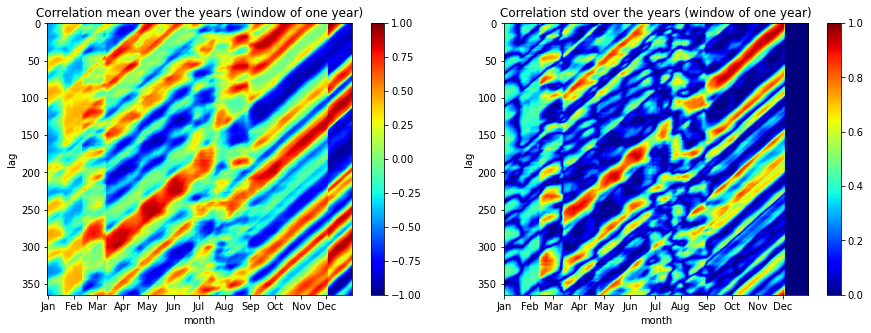

In [903]:
fig,axs = plt.subplots(1,2,figsize=(15,5))

#mean
ax = axs[0]
mean_cor = np.nanmean(cory[:max_lag,:,:],axis=2)
img=ax.imshow(mean_cor,cmap='jet',vmin=-1,vmax=1,aspect='auto')
ax.set_title(f"Correlation mean over the years (window of one year)")
ax.set_xlabel("month")
ax.set_xticks(fday)
ax.set_xticklabels(months)
ax.set_ylabel("lag")
plt.colorbar(img,ax=ax)

#std
ax = axs[1]
std_cor = np.nanstd(cory[:max_lag,:,:],axis=2)
img=ax.imshow(std_cor,cmap='jet',vmin=0,vmax=1,aspect='auto')
ax.set_title(f"Correlation std over the years (window of one year)")
ax.set_xlabel("month")
ax.set_xticks(fday)
ax.set_xticklabels(months)
ax.set_ylabel("lag")
plt.colorbar(img,ax=ax)
plt.show()

In [905]:
min_lag = 0
best_lag = np.argmax(np.sum(np.abs(mean_cor)[min_lag:],axis=1))+min_lag
best_lag/30

4.133333333333334

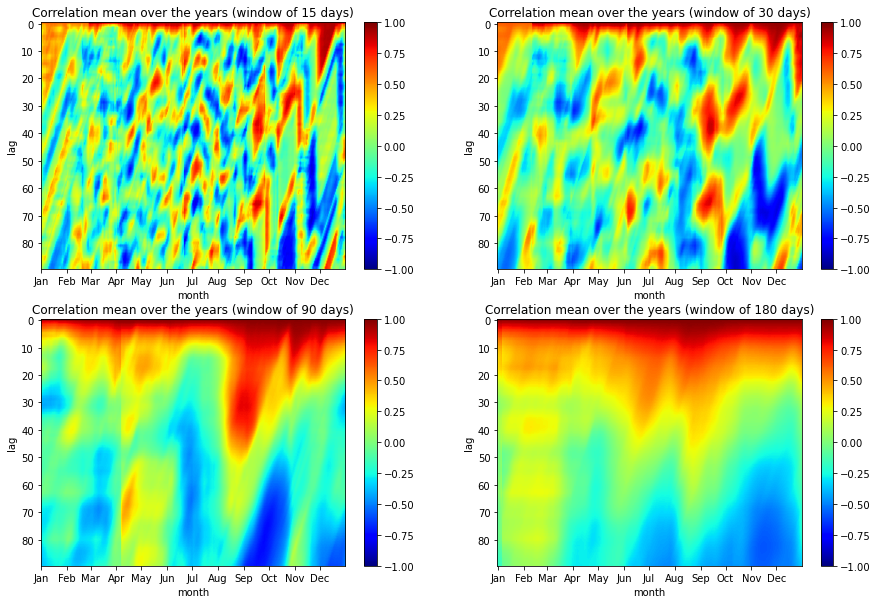

In [918]:
max_lag = 90
fig,axs = plt.subplots(2,2,figsize=(15,10))
axs = axs.ravel()
for idx,(cor,name) in enumerate(zip(img_list[:-1],name_list[:-1])):
    cory = yearly_cor(cor)
    mean_cor = np.nanmean(cory[:max_lag,:,:],axis=2)
    img=axs[idx].imshow(mean_cor,cmap='jet',vmin=-1,vmax=1,aspect='auto')
    axs[idx].set_title(f"Correlation mean over the years (window of {name} days)")
    axs[idx].set_xlabel("month")
    axs[idx].set_xticks(fday)
    axs[idx].set_xticklabels(months)
    axs[idx].set_ylabel("lag")
    plt.colorbar(img,ax=axs[idx])
plt.show()


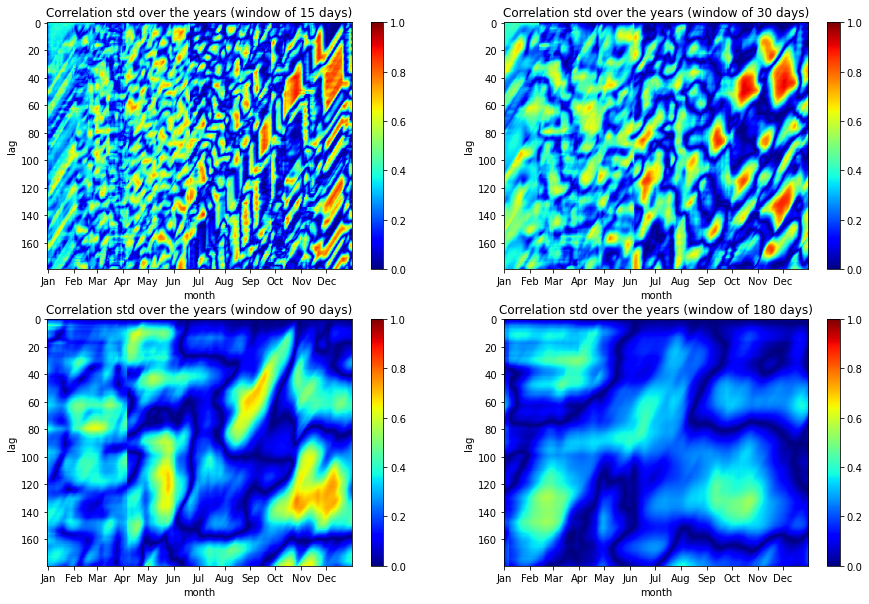

In [919]:
max_lag = 180
fig,axs = plt.subplots(2,2,figsize=(15,10))
axs = axs.ravel()
for idx,(cor,name) in enumerate(zip(img_list[:-1],name_list[:-1])):
    cory = yearly_cor(cor)
    mean_cor = np.nanstd(cory[:max_lag,:,:],axis=2)
    img=axs[idx].imshow(mean_cor,cmap='jet',vmin=0,vmax=1,aspect='auto')
    axs[idx].set_title(f"Correlation std over the years (window of {name} days)")
    axs[idx].set_xlabel("month")
    axs[idx].set_xticks(fday)
    axs[idx].set_xticklabels(months)
    axs[idx].set_ylabel("lag")
    plt.colorbar(img,ax=axs[idx])
plt.show()

#### Statistical view of the heat maps
Theses maps give the following informations: 
- The small windows are not very stable, as the standard deviation can quite often reach values close to one
- The bigger windows are more stable,and exhibit clear changes in decorrelation times: the chlorophyll a concentration is correlated over up to 50 days in august, but only around 5 in July and January
- More data could be useful, as there is a clear vertical line visible when a third year of data is available and where there are not. This means that the mean and variance did not converged yet, and that any use of these values must be taken carefully

### Cross correlation of Chlorophyll a and key parameters
The windowed correlation was tried to discover interesting links between the different measured variables.

In [950]:
croscor_d = {}
max_lag = 370
window_size = 30
for idx,key in enumerate(keys_imp):
    print(f"{idx}/{key}",end='\r')
    ccor = windowed_cor(dfi,key,'mean_chla',window_size,max_lag)
    ccory = yearly_cor(ccor)
    croscor_d[key] = {'wccor':ccory}

In [951]:
for d in croscor_d:
    print(d)

ciliate
mean_chla
cv_chla_day
cv_chla_depth
nauplius
Ammonium
Nitrat
mean_schmidt
windspeed_max
mean_thermocline_depth
mean_epi_temp
mean_oxycline_depth
mean_mixed_layer_depth
mean_global_radiation


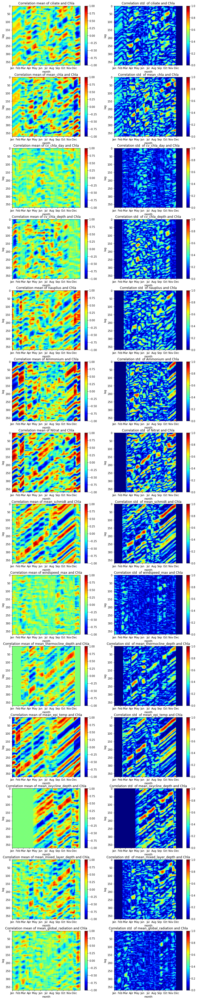

In [952]:
fig,axs = plt.subplots(len(croscor_d),2,figsize=(13,len(croscor_d)*5))
for idx,key in enumerate(croscor_d):
    #mean
    ax = axs[idx,0]
    mean_cor = np.nanmean(croscor_d[key]['wccor'],axis=2)
    img=ax.imshow(mean_cor,cmap='jet',vmin=-1,vmax=1,aspect='auto')
    ax.set_title(f"Correlation mean of {key} and Chla")
    ax.set_xlabel("month")
    ax.set_xticks(fday)
    ax.set_xticklabels(months)
    ax.set_ylabel("lag")
    plt.colorbar(img,ax=ax)

    #std
    ax = axs[idx,1]
    std_cor = np.nanstd(croscor_d[key]['wccor'],axis=2)
    img=ax.imshow(std_cor,cmap='jet',vmin=0,vmax=1,aspect='auto')
    ax.set_title(f"Correlation std  of {key} and Chla")
    ax.set_xlabel("month")
    ax.set_xticks(fday)
    ax.set_xticklabels(months)
    ax.set_ylabel("lag")
    plt.colorbar(img,ax=ax)
plt.show()

A quick look over theses figures shows that despite being potentially useful drivers, the relationship is likely not linear as the mean of the correlation is often close to 0. Also, one can see that some more data would still be of use: the variation in the mean when a new year of input is given is significant.

A table was containing the most correlated lags for each variables. To get a better view of the different time scales that the system is constrained into, a "minimum lag" was set either at 1,5 or 30 days. The lag of interest taken was then the one having the highest correlation, with the condition that it was bigger than the minimum lag

In [973]:
min_lags = [1,5,30]
max_lag = 370
np.linspace(0,365,5).astype(int)[:]
season = ['winter','spring','summer','fall']
for key in croscor_d:
    croscor_d[key]['best_lag']={}
    for min_lag in min_lags:
        min_lag
        for idx,season in enumerate(season)
        start_date = 
        ccor = np.nanmean(croscor_d[key]['wccor'],axis=2)
        croscor_d[key]['best_lag'][str(min_lag)]=np.argmax(np.sum(np.abs(ccor),axis=1)[min_lag:max_lag])+min_lag
    print(f"{key}: {croscor_d[key]['best_lag']}")

ciliate: {'1': 1, '5': 344, '30': 344}
mean_chla: {'1': 1, '5': 5, '30': 178}
cv_chla_day: {'1': 1, '5': 173, '30': 173}
cv_chla_depth: {'1': 83, '5': 83, '30': 83}
nauplius: {'1': 182, '5': 182, '30': 182}
Ammonium: {'1': 1, '5': 157, '30': 157}
Nitrat: {'1': 135, '5': 135, '30': 135}
mean_schmidt: {'1': 127, '5': 127, '30': 127}
windspeed_max: {'1': 302, '5': 302, '30': 302}
mean_thermocline_depth: {'1': 353, '5': 353, '30': 353}
mean_epi_temp: {'1': 160, '5': 160, '30': 160}
mean_oxycline_depth: {'1': 86, '5': 86, '30': 86}
mean_mixed_layer_depth: {'1': 212, '5': 212, '30': 212}
mean_global_radiation: {'1': 260, '5': 260, '30': 260}


Some artifacts are clearly visible in this table: The fact that the most correlated data is the one happening one year earlier means that this method is mainly looking at seasonal patterns rather than any type of causal effects. 

In [980]:
import pickle
file = 'cros_cor_dict.pickle'
with open(file, 'wb') as f:
    pickle.dump(croscor_d, f)

The results are hard to interpret, but one can check the kalman forest notebook to see how they are used.